In [0]:
#!pip uninstall tensorflow

In [0]:
#!pip install tensorflow-gpu==2.0.0

In [1]:
import tensorflow as tf
from tensorflow.keras import layers
import time
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.patches as mpatches
from sklearn.metrics import roc_auc_score
import random
import itertools
from sklearn.metrics import confusion_matrix
import tensorflow_probability as tfp
from sklearn.model_selection import train_test_split


print(tf.__version__)

2.0.0


In [2]:
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
sess = tf.compat.v1.Session(config=config)
config = tf.compat.v1.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.95
tf.compat.v1.Session(config=config)

## pretrain

In [3]:
names = np.array(['airplane',
'automobile',
'bird',
'cat',
'deer',
'dog',
'frog',
'horse',
'ship',
'truck'])

In [4]:
flatten_size = 32 * 32 * 3
img_size = 32
img_channel = 3
regular = 1e-5

z_dim = 128
h_dim = [32, 64, 128]
objective = 'deep-SVDD'     #'  'soft-boundary'


In [5]:
class Autoencoder():
    
    def __init__(self, label_num, img_size = img_size, z_dim = z_dim, h_dim = h_dim, img_channel = img_channel):
        names = np.array(['airplane',
        'automobile',
        'bird',
        'cat',
        'deer',
        'dog',
        'frog',
        'horse',
        'ship',
        'truck'])
        self.label_num = label_num
        self.label_name = names[label_num]
        self.flatten_size = img_size * img_size * img_channel
        self.z_dim = z_dim
        self.h_dim = h_dim
        self.encoder = self.make_encoder()
        self.decoder = self.make_decoder()
        self.ae_optimizer = tf.keras.optimizers.Adam(lr = 1e-4, epsilon = 1e-6)
        

    def make_encoder(self):

        inputs = tf.keras.Input(shape=(self.flatten_size,), name='inputs')
        x = tf.reshape(inputs, shape = (-1, 32, 32, 3))
        x = tf.keras.layers.Conv2D(self.h_dim[0], (5, 5), activation='linear', padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.MaxPool2D((2, 2), padding='same')(x)

        x = tf.keras.layers.Conv2D(self.h_dim[1], (5, 5), activation='linear', padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.MaxPool2D((2, 2), padding='same')(x)
        
        x = tf.keras.layers.Conv2D(self.h_dim[2], (5, 5), activation='linear', padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.MaxPool2D((2, 2), padding='same')(x)

        x = tf.keras.layers.Flatten(name = 'Flatten')(x)
        x = tf.keras.layers.BatchNormalization(epsilon = 1e-04)(x)
        x = tf.keras.layers.Dense(self.z_dim, use_bias = False, name = 'dense')(x)
        
        
        model = tf.keras.Model(inputs=inputs, outputs=x)

        return model    
   
    def make_decoder(self):

        inputs = tf.keras.Input(shape=(self.z_dim,), name='inputs')
        x = tf.reshape(inputs, shape = (-1, 4, 4, 8))
        x = tf.keras.layers.LeakyReLU()(x)
        #x = tf.keras.layers.UpSampling2D((2, 2))(x)    

        x = tf.keras.layers.Conv2DTranspose(self.h_dim[2], (5, 5), padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x)   

        x = tf.keras.layers.Conv2DTranspose(self.h_dim[1], (5, 5), padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x)
        
        x = tf.keras.layers.Conv2DTranspose(self.h_dim[0], (5, 5), padding='same',  use_bias = False)(x)
        x = tf.keras.layers.BatchNormalization()(x)
        x = tf.keras.layers.ELU()(x)
        x = tf.keras.layers.UpSampling2D((2, 2))(x) 
        
        x = tf.keras.layers.Conv2DTranspose(3, (5, 5), activation='sigmoid', padding='same',  use_bias = False)(x)
        #x = tf.reshape(x, shape = (-1, self.flatten_size))
        x = tf.keras.layers.Flatten(name = 'Flatten')(x)
        model = tf.keras.Model(inputs=inputs, outputs=x)

        return model  
    
    @tf.function
    def train_ae_model(self, batch_x):
        with tf.GradientTape() as ae_tape:
            ae_output = self.decoder(self.encoder(batch_x, training=True), training=True)
            loss = tf.reduce_mean((ae_output - batch_x) ** 2)

        grads = ae_tape.gradient(loss, self.encoder.trainable_variables + self.decoder.trainable_variables)
        self.ae_optimizer.apply_gradients(zip(grads, self.encoder.trainable_variables + self.decoder.trainable_variables))

        return loss
    
    def train_ae( self, n_ae_epochs, train_dataset):
        #loss_list = []
        for epoch in range(n_ae_epochs):
            epoch_ae_loss_avg = tf.metrics.Mean()
            if (epoch+1) % 250 == 0:
                self.ae_optimizer.lr = 0.1 * self.ae_optimizer.lr
            for batch, (batch_x) in enumerate(train_dataset):

                ae_loss = self.train_ae_model(batch_x)
                #epoch_ae_loss_avg(ae_loss)
            #loss_list.append(epoch_ae_loss_avg.result())
        
        self.encoder.save_weights('D:/7107018014/checkpoints/revist_deepSVDD/AE_label_{}'.format(
            self.label_name))
        #print('LOSS: {:.4f} '.format(epoch_ae_loss_avg.result()))
        #plt.title('label = {}'.format(self.label_name))
        #plt.plot(loss_list)
        #plt.show()
        

## training data

In [6]:
def load_data(label_num, batch_size = 200, outlier_nu = 0.1):
    # 0: normal, 1: outlier
    print("Loading ",names[label_num]," data...")
    x_train = np.load('D:/7107018014/cifar10/{}/{}_data{}_batch{}.npy'.format(label_num,'train',label_num, 0))
    y_train = np.load('D:/7107018014/cifar10/{}/{}_label{}_batch{}.npy'.format(label_num,'train',label_num, 0))
    x_train = np.transpose(x_train, (0, 2, 3, 1))
    
    
    for i in np.arange(2):
        data = np.load('D:/7107018014/cifar10/{}/{}_data{}_batch{}.npy'.format(label_num,'test',label_num, i))
        label = np.load('D:/7107018014/cifar10/{}/{}_label{}_batch{}.npy'.format(label_num,'test',label_num, i))
        
        data = np.transpose(data, (0, 2, 3, 1))
        try:
            x_test = np.vstack((x_test, data))
            y_test = np.hstack((y_test, label))
        except:
            x_test = data
            y_test = label
    ## outlier data
    for index in np.delete(np.arange(10), label_num):
        
        out_data = np.load('D:/7107018014/cifar10/{}/{}_data{}_batch{}.npy'.format(index,'train',index, 0))
        out_label = np.load('D:/7107018014/cifar10/{}/{}_label{}_batch{}.npy'.format(index,'train',index, 0))

        out_data = np.transpose(out_data, (0, 2, 3, 1))
        try:
            out_datas_ = np.vstack((out_datas_, out_data))
            out_labels_ = np.hstack((out_labels_, out_label))
        except:
            out_datas_ = out_data
            out_labels_ = out_label
        
    ### 製造outlier
    random.seed (1120)
    normal_n = len(x_train)
    outlier_n = len(out_datas_) ####
    indices = np.random.choice(outlier_n, int(normal_n * outlier_nu), replace=False)
    x_train = np.vstack( (x_train[y_train == label_num], out_datas_[indices]))
    y_train = np.hstack( (y_train[y_train == label_num], out_labels_[indices]))
    
    
    # Flatten the dataset
    x_train = x_train.reshape((-1, flatten_size))
    x_test = x_test.reshape((-1, flatten_size))

    
    return x_train, x_test, y_train, y_test

## 資料分割

In [7]:
def split_data(x_train, batch_size = 200):
    
    x_, x_vali, = train_test_split(x_train, test_size = 0.2, random_state = 42)
    n_samples = len(x_)
    no_vali_dataset = tf.data.Dataset.from_tensor_slices(x_)
    no_vali_dataset = no_vali_dataset.shuffle(buffer_size=1000)
    no_vali_dataset = no_vali_dataset.batch(batch_size)
    
    train_dataset = tf.data.Dataset.from_tensor_slices(x_train)
    train_dataset = train_dataset.shuffle(buffer_size=1000)
    train_dataset = train_dataset.batch(batch_size)
    
    
    
    x_vali_tensor = tf.convert_to_tensor(x_vali)
    validation_n = len(x_vali)
    
    return no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n

## SVDD 模型(encoder 初始值 + certer初始值)

In [8]:
class make_SVDD_model():
    def __init__(self, train_dataset , encoder, z_dim = z_dim):
        self.encoder = encoder
        self.z_dim = z_dim
        self.train_dataset = train_dataset
        self.SVDD_model = self.make_model()
    

    
    def initializer(self):
        
        #bias_init = np.array(self.init_center_c( eps = 0.1))
        kernel_initializer = self.encoder.get_layer('dense').get_weights()[0]
        
        return  kernel_initializer
    
    def make_model(self):
        
        kernel_initializer = self.initializer()
        
        self.encoder.trainable = True
        x = self.encoder.get_layer('Flatten').output
        outputs = tf.keras.layers.Dense(
        self.z_dim, activation=None, kernel_initializer = tf.constant_initializer(kernel_initializer), use_bias=False)(x)
        model_new = tf.keras.Model(inputs = self.encoder.input, outputs = outputs)
    
        return model_new
    

## 訓練結果

In [9]:
def distance_plot(label_num, dis, R, name, label = None, train = True):

    if train:
        plt.title('label = {} train data'.format(name))
        plt.hist(dis[label!=label_num], rwidth=0.3, color='r' ,bins = 100,label = 'anomaly')
        plt.hist(dis[label==label_num], rwidth = 0.3, color = 'b',label = 'normal', bins = 100)
        plt.axvline(float(R ** 2), color='g')
        plt.legend()
        plt.show()


    else:
        plt.title('label = {} test data'.format(name))
        plt.hist(dis[label!=label_num], rwidth=0.3, color='r' ,bins = 100,label = 'anomaly')
        plt.hist(dis[label==label_num], rwidth = 0.3, color = 'b',label = 'normal', bins = 100)
        plt.axvline(float(R ** 2), color='g')
        plt.legend()
        plt.show()


In [10]:
def threshold_img(data, dist2radius):
    dict_score = {}
    for i in range(len(dist2radius)):
        dict_score[float(dist2radius[i])] = i
    sort_score = [(k, dict_score[k]) for k in sorted(dict_score.keys())]
    
    n_digits = 20  # how many digits we will display
    fig = plt.figure(figsize=(20, 4))
    for i in range(1, n_digits):
        # display normal
        ax = plt.subplot(2, n_digits, i + 1)
        plt.imshow(data[sort_score[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # display anomaly
        ax = plt.subplot(2, n_digits, i + 1 + n_digits)
        plt.imshow(data[sort_score[-i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()


In [11]:
def threshold_uncertain_img(data, dists, r):
    dist2radius = (dists - r**2)
    normal = dist2radius[dist2radius<0]
    anomaly = dist2radius[dist2radius>0]
    normal_score = {}
    anomaly_score = {}
    for i in range(len(normal)):
        normal_score[float(normal[i])] = i
    for i in range(len(anomaly)):
        anomaly_score[float(anomaly[i])] = i
    normalsort_score = [(k, normal_score[k]) for k in sorted(normal_score.keys())]
    anomalysort_score = [(k, anomaly_score[k]) for k in sorted(anomaly_score.keys())]
    
    n_digits = min([len(normal),len(anomaly),20])#20  # how many digits we will display
    fig = plt.figure(figsize=(20, 4))
    #print('normal:', len(normal), 'anomaly', len(anomaly))
    for i in range(1, n_digits):
        # display normal
        ax = plt.subplot(2, n_digits, i + 1)
        plt.imshow(data[normalsort_score[-i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

        # display anomaly
        ax = plt.subplot(2, n_digits, i + 1 + n_digits)
        plt.imshow(data[anomalysort_score[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    plt.show()

In [12]:
def false_img(data, labels_,  dists, r, label_num):
    dist2radius = (dists - r**2)
    dist_n = dist2radius[labels_ != label_num]
    dist_p = dist2radius[labels_ == label_num]
    data_n = data[labels_ != label_num]
    data_p = data[labels_ == label_num]
    fn = dist_n[dist_n<0]
    fp = dist_p[dist_p>0]
    fn_score = {}
    fp_score = {}
    for i in range(len(fn)):
        fn_score[float(fn[i])] = i
    for i in range(len(fp)):
        fp_score[float(fp[i])] = i
        
    fn_score_sort = [(k, fn_score[k]) for k in sorted(fn_score.keys())]
    fp_score_sort = [(k, fp_score[k]) for k in sorted(fp_score.keys())]
    
    if sum(labels_ != label_num) > 0:
    
        n_digits = min([len(fn),len(fp),10])#20  # how many digits we will display
        fig = plt.figure(figsize=(20, 4))
        #print('normal:', len(normal), 'anomaly', len(anomaly))
        for i in range(1, n_digits):
            # display fn
            ax = plt.subplot(2, n_digits, i + 1)
            plt.imshow(data_n[fn_score_sort[-i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

            # display fp
            ax = plt.subplot(2, n_digits, i + 1 + n_digits)
            plt.imshow(data_p[fp_score_sort[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()
        
    else:
        n_digits = min([len(fp),10])
        fig = plt.figure(figsize=(20, 4))
        #print('normal:', len(normal), 'anomaly', len(anomaly))
        for i in range(1, n_digits):

            # display fp
            ax = plt.subplot(2, n_digits, i + 1 + n_digits)
            plt.imshow(data_p[fp_score_sort[i][1]].reshape(img_size, img_size, img_channel), cmap = plt.cm.gray)
            ax.get_xaxis().set_visible(False)
            ax.get_yaxis().set_visible(False)

        plt.show()

## Train SVDD_model

In [13]:
class Revisit_DeepSVDD_Trainer():
    
    def __init__(self, label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change):
        names = np.array(['airplane',
        'automobile',
        'bird',
        'cat',
        'deer',
        'dog',
        'frog',
        'horse',
        'ship',
        'truck'])
        self.nu = nu
        self.lr_change = lr_change
        self.label_num = label_num
        self.label_name = names[label_num]
        SVDD_model.load_weights('D:/7107018014/checkpoints/revist_deepSVDD/AE_label_{}'.format(
            self.label_name))
        self.SVDD_model = SVDD_model
        self.lr_mile_stone = lr_milestone
        self.train_dataset = train_dataset
        self.warm_up_n_epochs = warm_up_n_epochs
        self.nu = nu
        ## 設置lagrange因子、Radius
        
        self.center = self.init_center_c()
        self.optimizer = tf.keras.optimizers.Adam(lr = 5e-4, epsilon = 1e-6)
        
    def init_center_c(self):

        for batch, (batch_x) in enumerate(self.train_dataset):
            output = self.SVDD_model(batch_x, training=False)            
            if batch ==0:
                modeloutput = output
            else:
                modeloutput = tf.concat([modeloutput, output], 0)
        c = tf.Variable(tf.reduce_mean(modeloutput, axis = 0, name = 'outputs')) 
        
        return c
    
    def get_radius(self, dis_square):
    
        return tfp.stats.percentile(tf.sqrt(dis_square), (1 - self.nu)*100)
   
    def loss_function(self, output, center):
        
        distance = output - center 
        all_distance = tf.reduce_sum(tf.square(distance), 1)
        objective =  tf.reduce_sum(all_distance)
        
        return objective
    
    def validation_objective_loss(self, data, center):
        
        output = self.SVDD_model(data, training = False)
        distance = output - center 
        all_distance = tf.reduce_sum(tf.square(distance), 1)
        objective =  tf.reduce_sum(all_distance)

        return objective

    @tf.function
    def train_model(self, data, center):
        with tf.GradientTape() as tape:
            output = self.SVDD_model(data, training=True)
            loss_train = self.loss_function( output, center)

        grads = tape.gradient(loss_train, ( self.SVDD_model.trainable_variables))
        self.optimizer.apply_gradients(zip(grads, (self.SVDD_model.trainable_variables)))

        return loss_train
    
    @tf.function
    def train_center(self, data, center):
        with tf.GradientTape() as tape:
            output = self.SVDD_model(data, training=False)
            loss_train = self.loss_function( output, center)

        grads = tape.gradient(loss_train, ([self.center]))
        self.optimizer.apply_gradients(zip(grads, ([self.center])))

        return loss_train
    
    def validation_train(self, x_vali):
        objective_break = False
   
        objective_list = []
        validation_loss_list = []

        
        pre_objective_loss = np.inf
        objective_loss = 0
        pre_validation_loss = np.inf
        objective_loss = 0
        
        epoch = 0
        save = False
        while abs(pre_objective_loss - objective_loss) > 1e-6:

            epoch_loss_avg = tf.metrics.Mean()
        
            pre_objective_loss = objective_loss
            if (epoch+1) % self.lr_mile_stone == 0:
                self.optimizer.lr = self.lr_change * self.optimizer.lr
            
            for batch, (batch_x) in enumerate(self.train_dataset):
                loss = self.train_model(batch_x,  self.center)
                epoch_loss_avg(loss)
                if (epoch >= self.warm_up_n_epochs):
                    self.train_center(batch_x,  self.center)
            if (epoch < self.warm_up_n_epochs):
                self.center.assign(self.init_center_c())
                
            validation_loss = self.validation_objective_loss(x_vali, self.center)
            objective_loss = epoch_loss_avg.result()

            objective_list.append(objective_loss)
            validation_loss_list.append(validation_loss)
            
            ## 檢查early stopping
            if epoch >  self.warm_up_n_epochs + 5 and epoch % 5 ==0:
                if save and pre_validation_loss - validation_loss < 0:
                    objective_break = True
                    epoch = epoch - 5
                    break
                save = True
            pre_validation_loss  =  validation_loss
            
            epoch += 1
        
         
        ## 劃出loss結果
        
        plt.plot(objective_list, label = 'train')
        plt.plot(validation_loss_list, label = 'validation')
        plt.title('{} loss'.format(self.label_name))
        plt.legend()
        plt.show()
        '''
        plt.plot(objective_list[-1000:])
        plt.title('last 1000 train objective loss')
        plt.show()
        plt.plot(validation_loss_list[-1000:])
        plt.title('last 1000 validation objective loss')
        plt.show()
        '''
        return epoch
    
    def last_train(self, train_dataset, epoch_n):
        
        for epoch in range(epoch_n):
            
            if (epoch+1) % self.lr_mile_stone == 0:
                self.optimizer.lr = self.lr_change * self.optimizer.lr

            for batch, (batch_x) in enumerate(self.train_dataset):
                loss = self.train_model(batch_x,  self.center)
                if (epoch >= self.warm_up_n_epochs):
                    self.train_center(batch_x,  self.center)
            if (epoch < self.warm_up_n_epochs):
                self.center.assign(self.init_center_c())
        
        self.SVDD_model.save_weights('D:/7107018014/checkpoints/revist_deepSVDD/model_label_{}_outlier_{}'.
                                     format( self.label_name, self.nu))
        np.save('D:/7107018014/checkpoints/revist_deepSVDD/center_label_{}_outlier_{}'.format(self.label_name,
                                                                             self.nu), self.center.numpy())
        
    def distance(self, data, label, load_model = True, train  = True):
        if load_model:
            self.SVDD_model.load_weights('D:/7107018014/checkpoints/revist_deepSVDD/model_label_{}'
                                         .format(self.label_name))
            center_end = tf.constant(np.load('D:/7107018014/checkpoints/revist_deepSVDD/center_label_{}.npy'
                                 .format(self.label_name)))
    
        batch_size = 200
        train_dataset = tf.data.Dataset.from_tensor_slices((data,label))
        train_dataset = train_dataset.batch(batch_size)

        for batch, (batch_x, batch_y) in enumerate(train_dataset):
            output = self.SVDD_model(batch_x, training=False) - center_end
            dist = tf.reduce_sum(tf.math.square(output) , axis=1) 
            
            if batch ==0:
                dis_square = dist
                labels_ = batch_y
                datas = batch_x
            else:
                dis_square = tf.concat([dis_square, dist], 0)
                labels_ = tf.concat([labels_, batch_y], 0)
                datas = tf.concat([datas, batch_x], 0)
                
        dis_square = dis_square.numpy()
        labels_ = labels_.numpy()
        datas = datas.numpy()
            
        if train:
            radius_end = self.get_radius(dis_square).numpy()
            np.save('D:/7107018014/checkpoints/revist_deepSVDD/radius_label_{}_outlier_{}'.
                    format(self.label_name, self.nu), radius_end)
        else:
            radius_end =  np.load('D:/7107018014/checkpoints/revist_deepSVDD/radius_label_{}_outlier_{}.npy'.
                                  format(self.label_name, self.nu))

        
        return datas, labels_, dis_square, radius_end
    
    def result(self, dist, y_test, radius_end, show_img = False):
        
        y_true = y_test == self.label_num
        scores = dist - radius_end ** 2
        y_prob = 1/dist
        auc = roc_auc_score(y_true, y_prob)
        confusionmatrix = confusion_matrix(y_true, scores<0)
        if show_img:
            print('AUC:', auc)
            print('confusion_matrix:')
            print(confusionmatrix)

        return auc, confusionmatrix 
            
    def train_result(self, x_train, y_train, load_model = True, show_img = False):
            
        datas, labels_, dis_square, radius_end= self.distance(x_train, label = y_train, load_model = load_model)
        if show_img:
            distance_plot(self.label_num, dis = dis_square, R = radius_end,  name = self.label_name,
                          label = labels_, train = True)
            print(' train label = {} uncertain_img'.format(self.label_name))
            threshold_uncertain_img(datas, dis_square, radius_end)
            print('train label = {} distance oder'.format(self.label_num))
            threshold_img(datas, dis_square)
            print('train label = {} false_img'.format(self.label_name))
            false_img(datas, labels_,  dis_square, radius_end, self.label_num)

        
    
    def test_result(self, x_test, y_test, load_model = True, show_img = False):
            
        datas, labels_, dis_square, radius_end = self.distance(x_test, label = y_test, load_model = load_model, 
                                                               train = False)
        auc, confusionmatrix = self.result(dis_square, labels_, radius_end, show_img = show_img)
        if show_img:
            distance_plot(self.label_num, dis = dis_square, R = radius_end, name = self.label_name,
                          label = labels_, 
                          train = False)
            print('test label = {} uncertain_img'.format(self.label_name))
            threshold_uncertain_img(datas, dis_square, radius_end)
            print('test label = {} distance oder'.format(self.label_name))
            threshold_img(datas, dis_square)
            print('test label = {} false_img'.format(self.label_name))
            false_img(datas, labels_,  dis_square, radius_end, self.label_num)
            
        return auc, confusionmatrix

## 不經過Autoencoder

#### 選超參數

In [14]:
##--------------------------------------------------------------------------------------------

In [15]:
'''space  = [Integer(2, 15, name='smoothing')]
@use_named_args(space)
def ValidateModel(smoothing):
    
    x_train, y_train, x_test, y_test = load_data(label_num = label_num)
    
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    ## 利用validation data 決定訓練epoch
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = SA_DeepSVDD_Trainer(label_num, nu, SVDD_model, n_samples, validation_n, smoothing)
    epoch_n, loss = train_SVDD.valistation_train( no_vali_dataset, x_vali_tensor)

    return loss'''

"space  = [Integer(2, 15, name='smoothing')]\n@use_named_args(space)\ndef ValidateModel(smoothing):\n    \n    x_train, y_train, x_test, y_test = load_data(label_num = label_num)\n    \n    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)\n    ## 利用validation data 決定訓練epoch\n    ae = Autoencoder(label_num)\n    encoder = ae.encoder\n    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)\n    SVDD_model = make_SVDD.make_model() \n    train_SVDD = SA_DeepSVDD_Trainer(label_num, nu, SVDD_model, n_samples, validation_n, smoothing)\n    epoch_n, loss = train_SVDD.valistation_train( no_vali_dataset, x_vali_tensor)\n\n    return loss"

In [16]:
'''label_nu = np.zeros((10, 2))
i = 0
for label_num in names:
    search_result = gp_minimize(ValidateModel, space, n_calls = 10)
    label_nu[i, 0] = search_result.x[0]
    label_nu[i, 1] = search_result.fun
    i += 1'''

'label_nu = np.zeros((10, 2))\ni = 0\nfor label_num in names:\n    search_result = gp_minimize(ValidateModel, space, n_calls = 10)\n    label_nu[i, 0] = search_result.x[0]\n    label_nu[i, 1] = search_result.fun\n    i += 1'

In [17]:
#label_nu

## 不選超參數

## ---------------------------------------------------------------------------------------------------------

Loading  airplane  data...


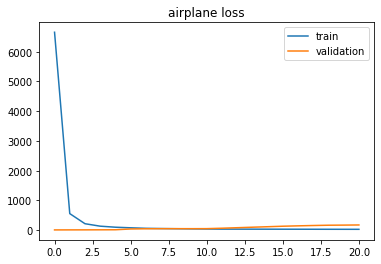

auc =  0.570322
[[1646 7354]
 [ 106  894]]
Loading  automobile  data...


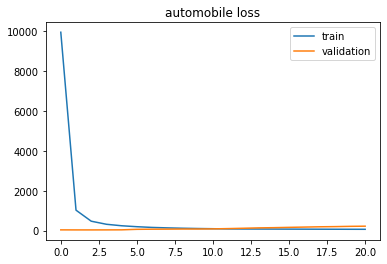

auc =  0.5730101666666667
[[1475 7525]
 [ 115  885]]
Loading  bird  data...


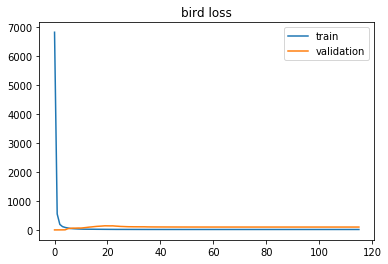

auc =  0.5375586666666667
[[1112 7888]
 [  89  911]]
Loading  cat  data...


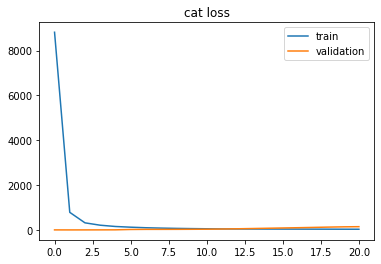

auc =  0.40107594444444444
[[ 271 8729]
 [  97  903]]
Loading  deer  data...


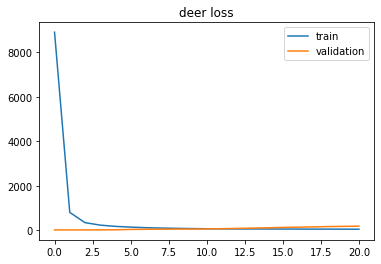

auc =  0.5307747777777778
[[1347 7653]
 [  99  901]]
Loading  dog  data...


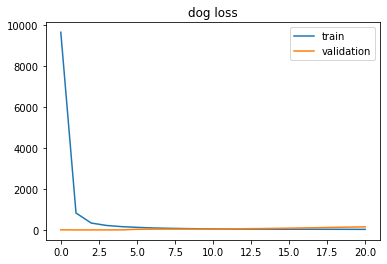

auc =  0.6417838888888888
[[2222 6778]
 [ 118  882]]
Loading  frog  data...


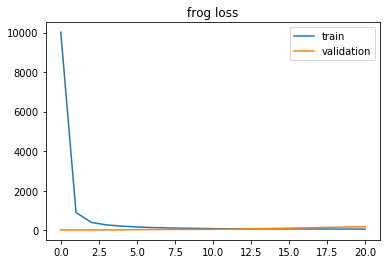

auc =  0.6073032222222222
[[2364 6636]
 [ 105  895]]
Loading  horse  data...


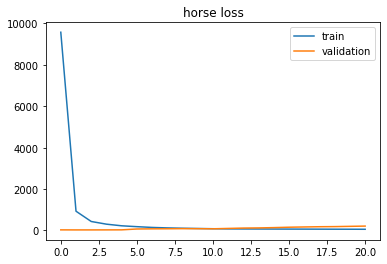

auc =  0.6086071111111111
[[1469 7531]
 [ 110  890]]
Loading  ship  data...


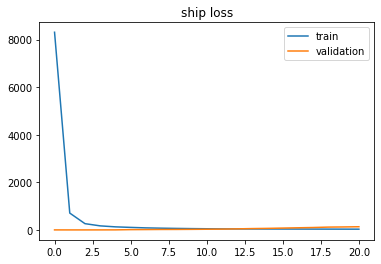

auc =  0.2639430555555556
[[ 413 8587]
 [  96  904]]
Loading  truck  data...


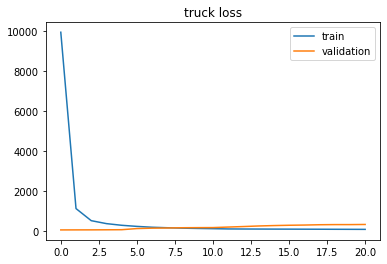

auc =  0.3784288333333333
[[ 473 8527]
 [ 102  898]]


In [19]:
nu = 0.1
outlier_nu = 0.
lr_change = 0.25
warm_up_n_epochs = 5
lr_milestone = 12
label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []
for label_num in np.arange(10):
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    ## 利用validation data 決定訓練epoch
    ae = Autoencoder(label_num)
    ae.train_ae(10, train_dataset)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    epoch_n= train_SVDD.validation_train( x_vali_tensor)
    ## 利用train data 訓練所有資料
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(train_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    train_SVDD.last_train(train_dataset, epoch_n)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = False)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True)
    print('auc = ', test_auc)
    print(confusionmatrix)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)


In [53]:
#outlier_nu = 0.3, nu = 0.5, smoothing = 4, warm_up_n_epochs = 30, lr_milestone = 10, lr_change = 0.5
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])
    print(confusionmatrix_list[i])

label =  airplane
auc =  0.566227111111111
time =  264.0698502063751
[[1478 7522]
 [ 107  893]]
label =  automobile
auc =  0.5621114444444444
time =  234.2394664287567
[[1623 7377]
 [ 116  884]]
label =  bird
auc =  0.48143377777777774
time =  259.91791105270386
[[ 735 8265]
 [  95  905]]
label =  cat
auc =  0.5101314444444445
time =  258.4124937057495
[[1036 7964]
 [ 131  869]]
label =  deer
auc =  0.5256738888888889
time =  246.8267376422882
[[1406 7594]
 [ 107  893]]
label =  dog
auc =  0.5518621111111112
time =  232.05008172988892
[[1433 7567]
 [ 123  877]]
label =  frog
auc =  0.5365165555555556
time =  228.47732639312744
[[1747 7253]
 [ 127  873]]
label =  horse
auc =  0.5380593333333333
time =  233.7708649635315
[[1564 7436]
 [ 131  869]]
label =  ship
auc =  0.4470952777777778
time =  226.69636797904968
[[1426 7574]
 [ 100  900]]
label =  truck
auc =  0.6267311111111111
time =  229.04244232177734
[[2224 6776]
 [ 112  888]]


Loading  airplane  data...


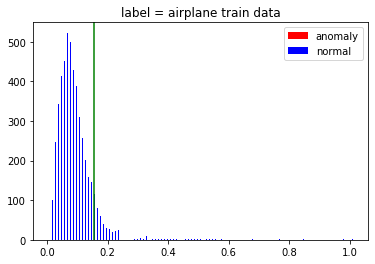

 train label = airplane uncertain_img


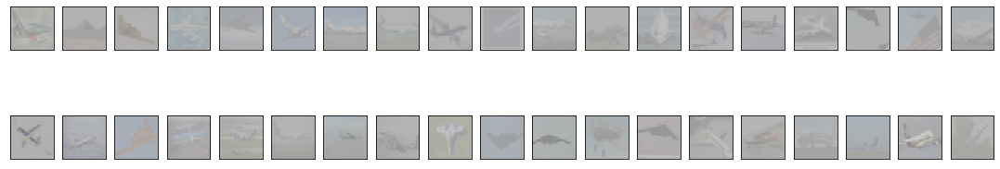

train label = 0 distance oder


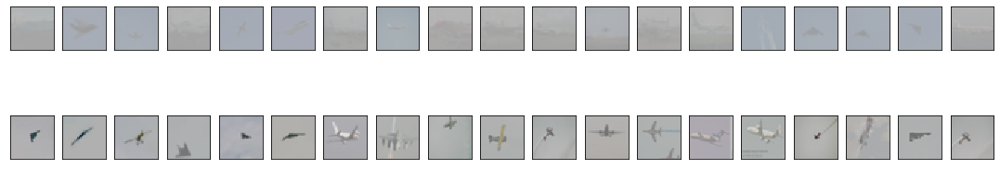

train label = airplane false_img


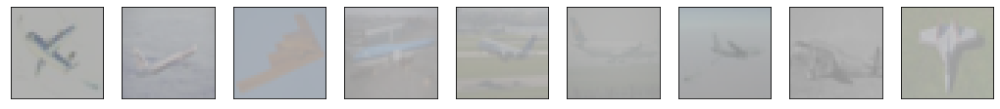

AUC: 0.5925397222222223
confusion_matrix:
[[ 910 8090]
 [ 107  893]]


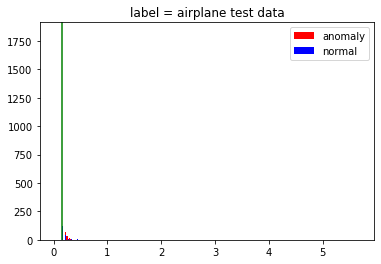

test label = airplane uncertain_img


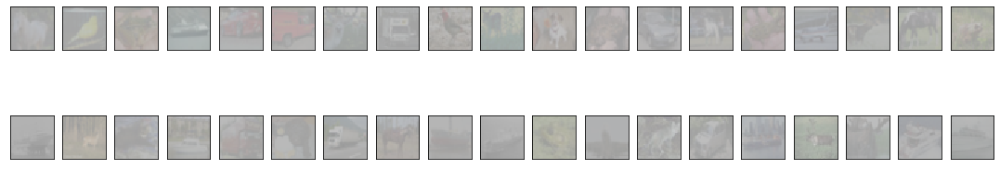

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = airplane distance oder


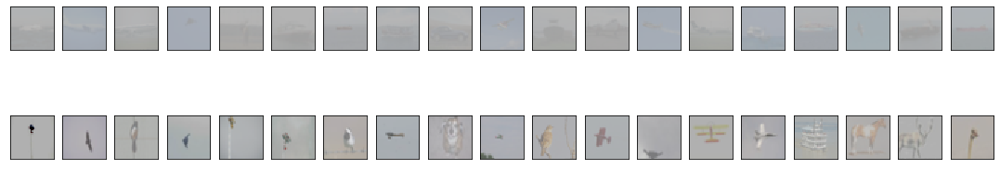

test label = airplane false_img


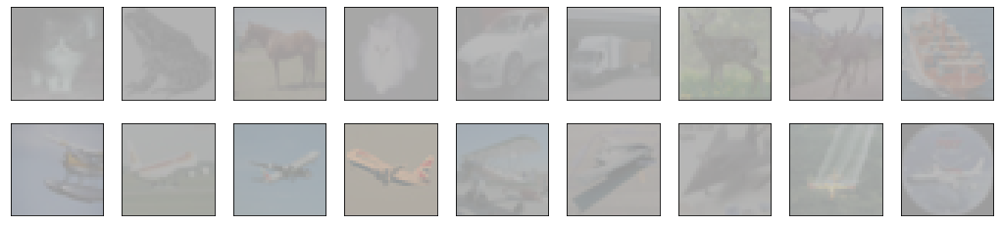

Loading  automobile  data...


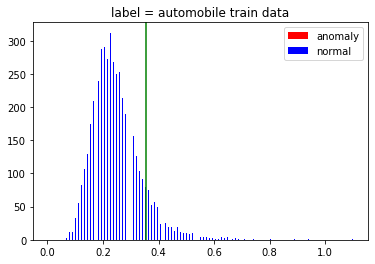

 train label = automobile uncertain_img


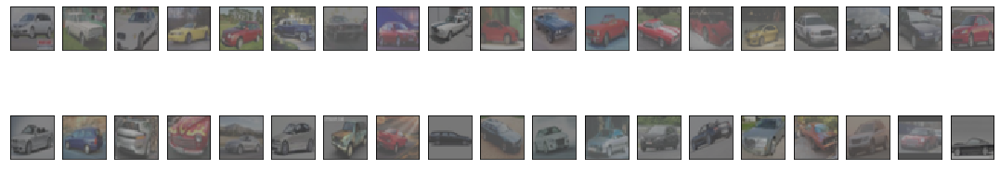

train label = 1 distance oder


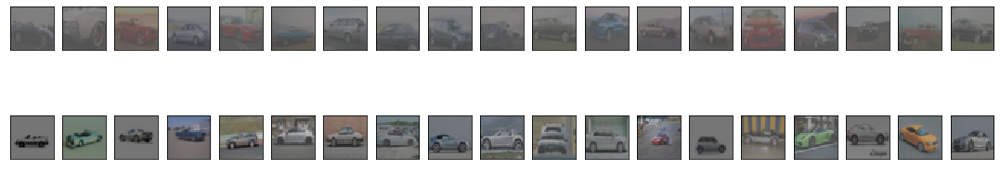

train label = automobile false_img


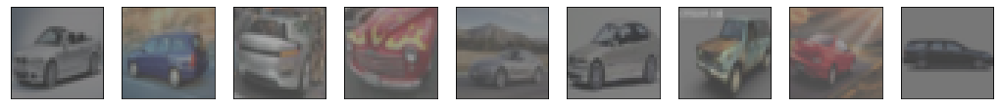

AUC: 0.5669462222222222
confusion_matrix:
[[2153 6847]
 [ 164  836]]


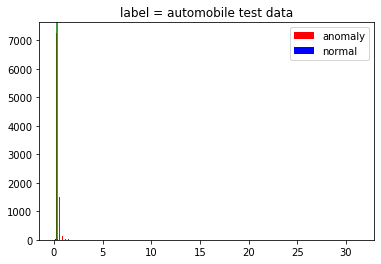

test label = automobile uncertain_img


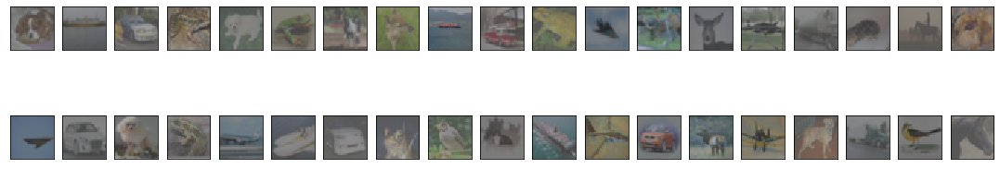

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = automobile distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

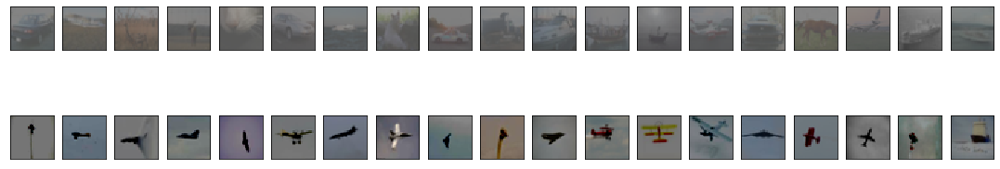

test label = automobile false_img


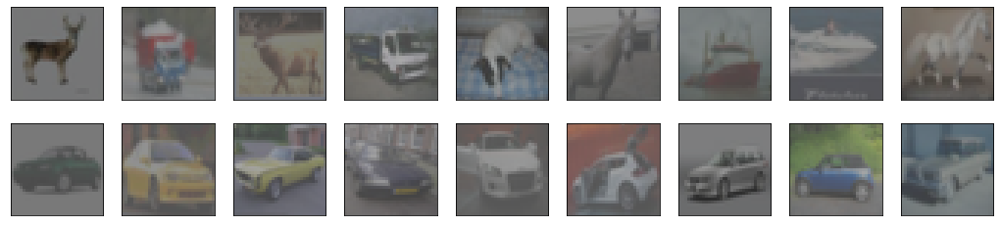

Loading  bird  data...


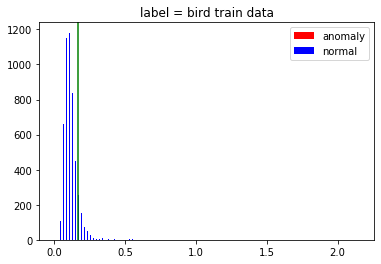

 train label = bird uncertain_img


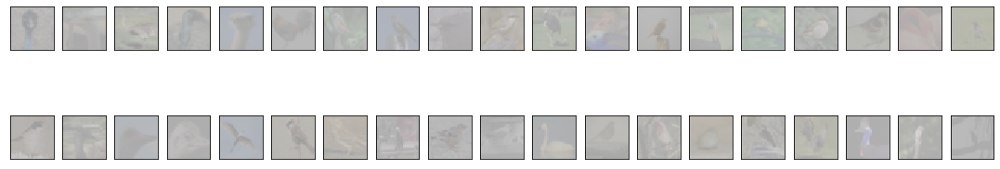

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 2 distance oder


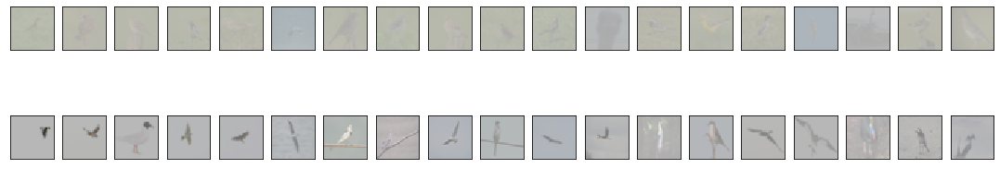

train label = bird false_img


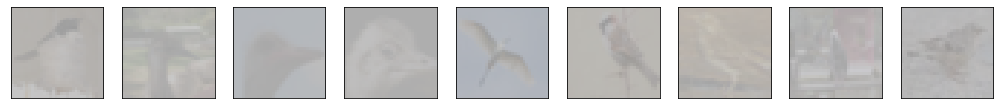

AUC: 0.4806143333333333
confusion_matrix:
[[ 631 8369]
 [  89  911]]


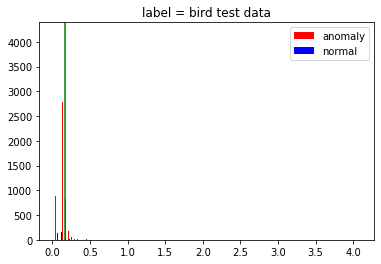

test label = bird uncertain_img


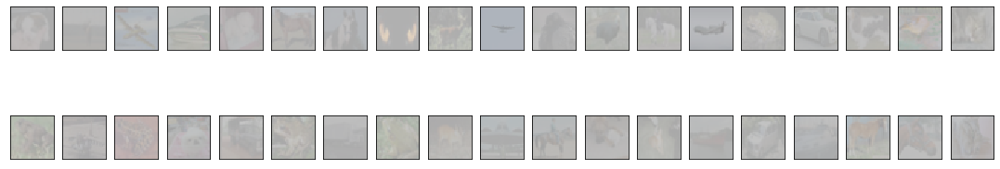

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = bird distance oder


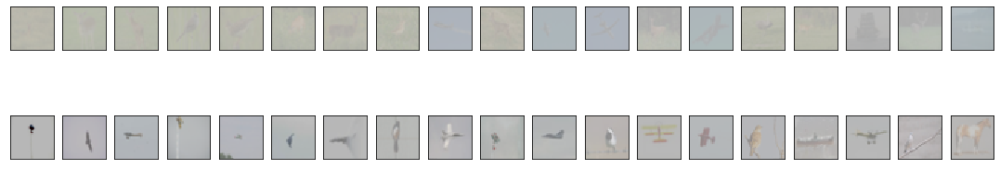

test label = bird false_img


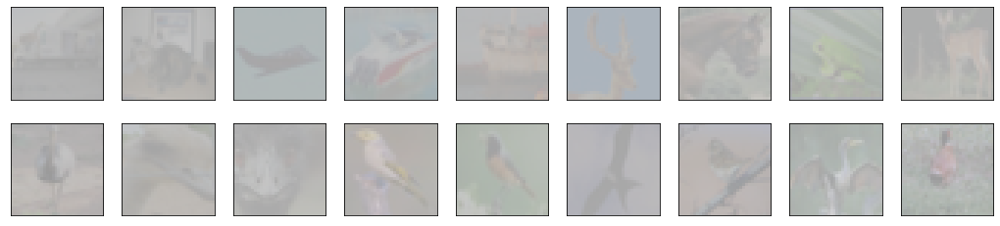

Loading  cat  data...


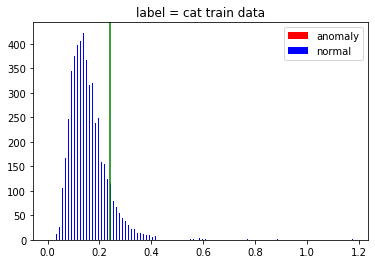

 train label = cat uncertain_img


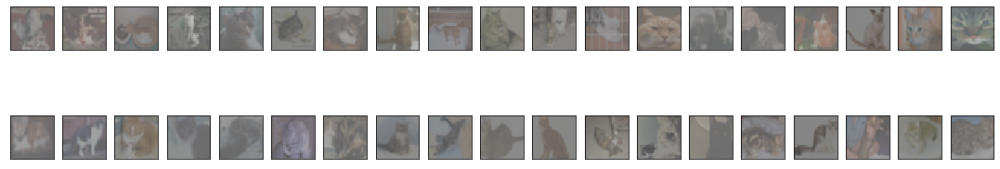

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 3 distance oder


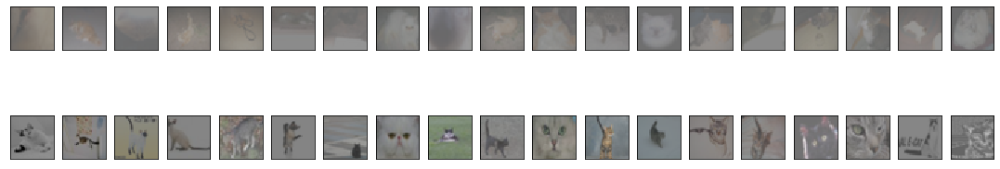

train label = cat false_img


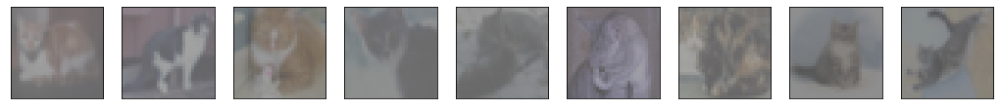

AUC: 0.5928863888888889
confusion_matrix:
[[2055 6945]
 [ 136  864]]


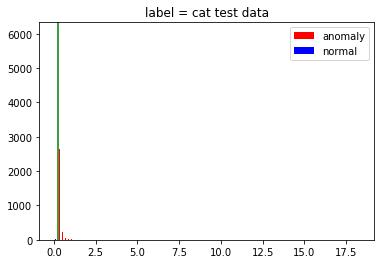

test label = cat uncertain_img


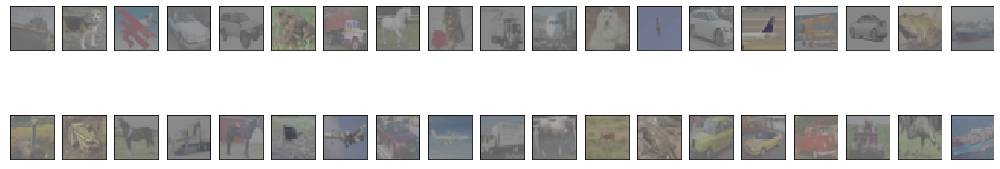

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = cat distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


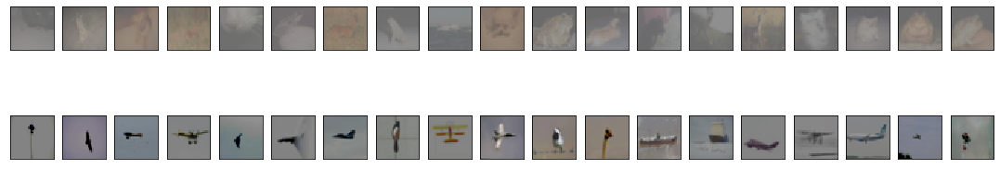

test label = cat false_img


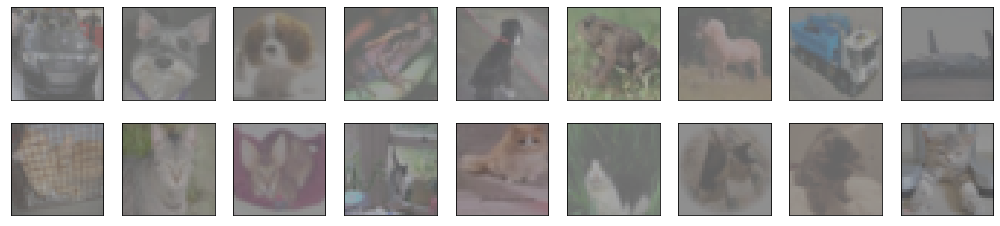

Loading  deer  data...


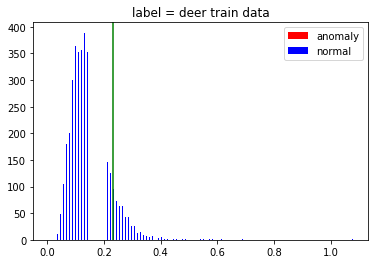

 train label = deer uncertain_img


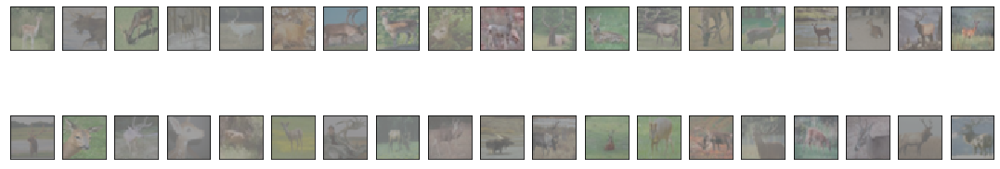

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 4 distance oder


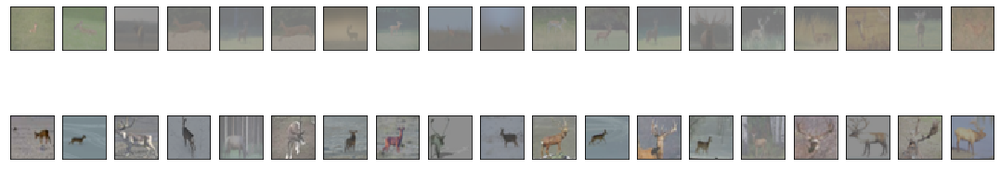

train label = deer false_img


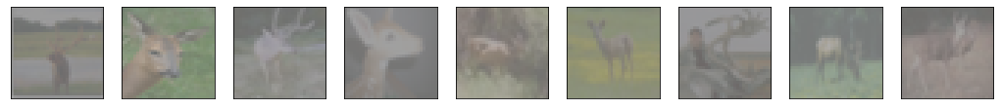

AUC: 0.5314075
confusion_matrix:
[[1444 7556]
 [ 146  854]]


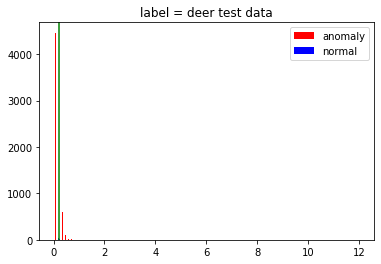

test label = deer uncertain_img


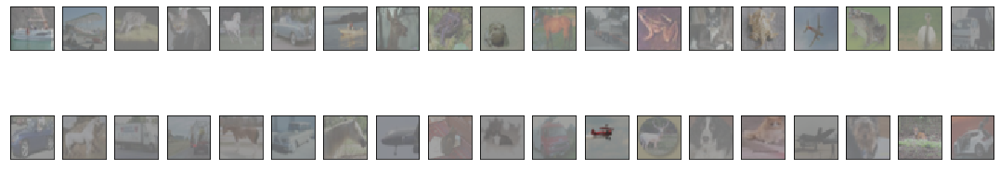

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = deer distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


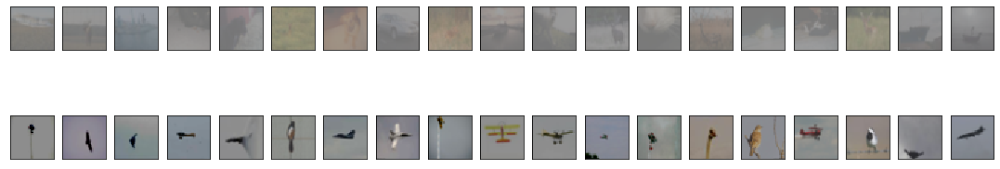

test label = deer false_img


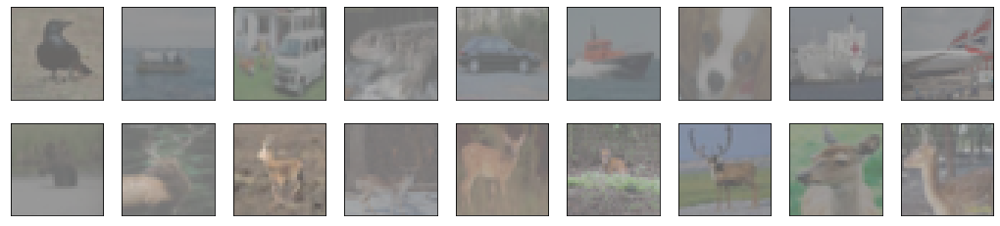

Loading  dog  data...


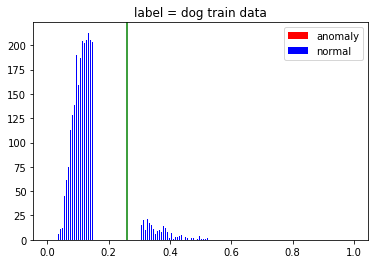

 train label = dog uncertain_img


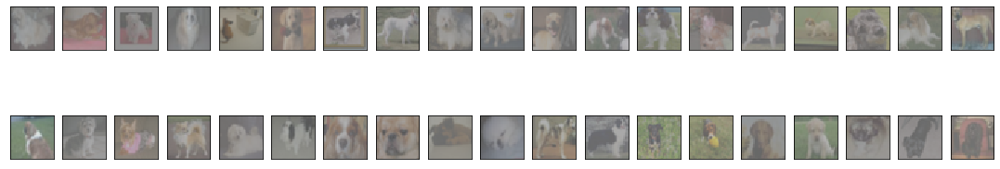

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 5 distance oder


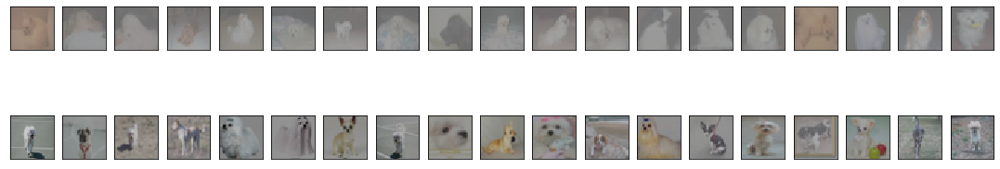

train label = dog false_img


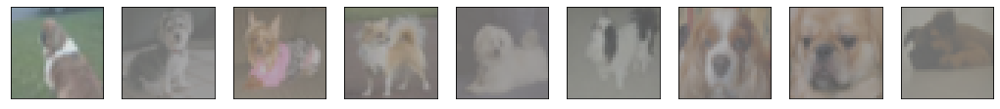

AUC: 0.6467473333333333
confusion_matrix:
[[2380 6620]
 [ 110  890]]


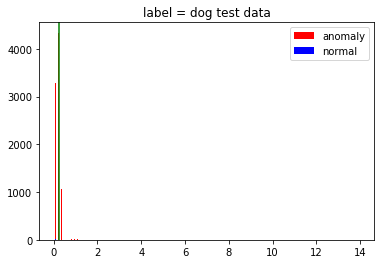

test label = dog uncertain_img


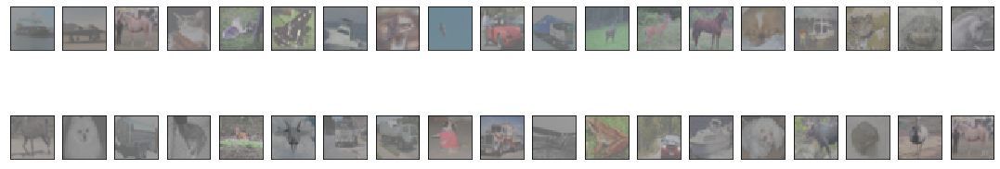

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = dog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


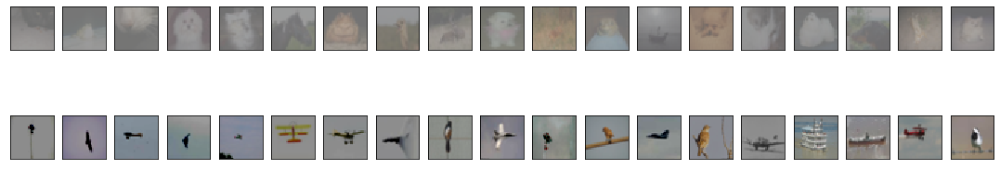

test label = dog false_img


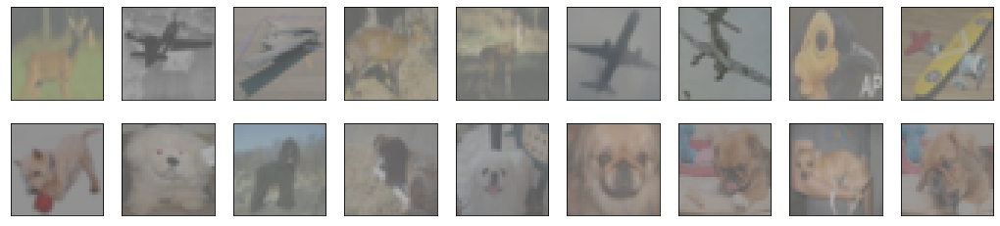

Loading  frog  data...


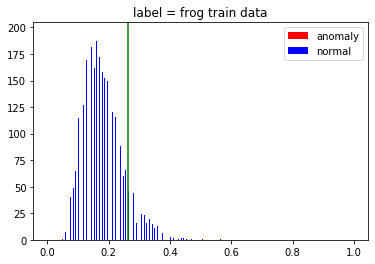

 train label = frog uncertain_img


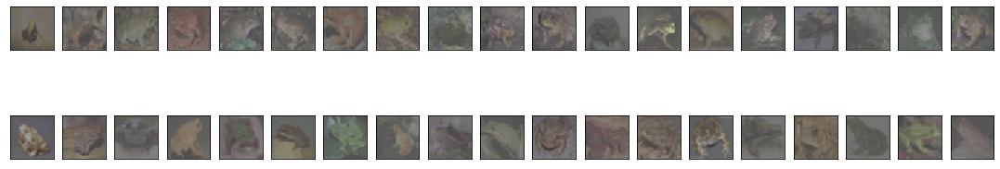

train label = 6 distance oder


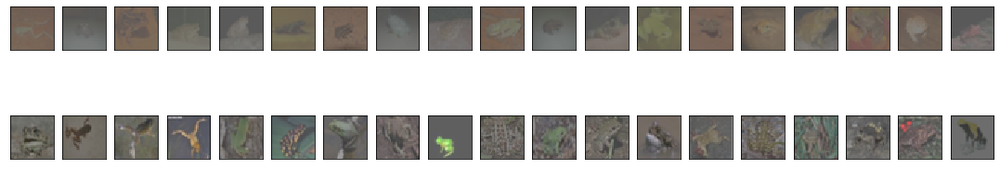

train label = frog false_img


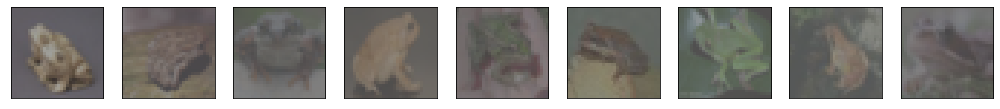

AUC: 0.5915664444444444
confusion_matrix:
[[2036 6964]
 [ 122  878]]


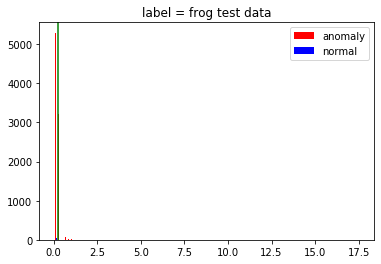

test label = frog uncertain_img


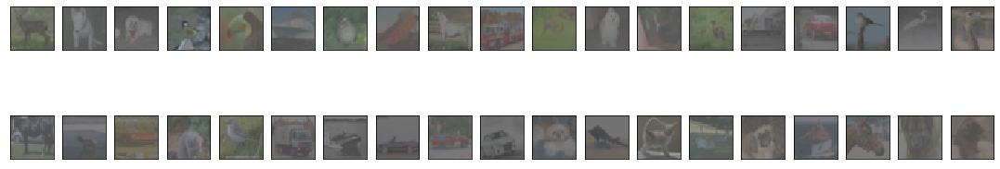

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = frog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


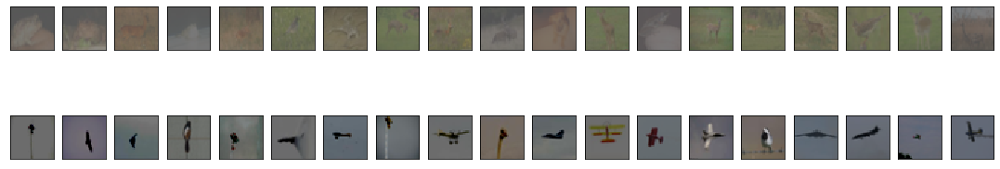

test label = frog false_img


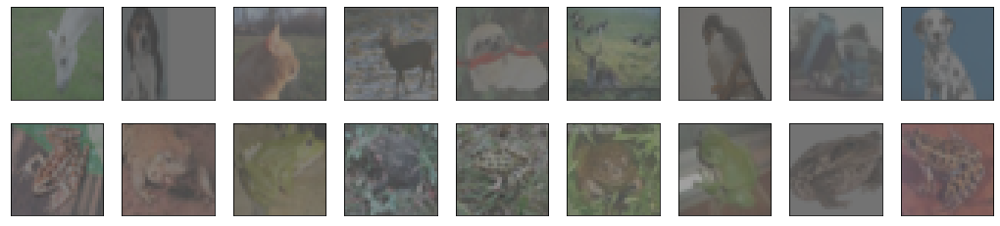

Loading  horse  data...


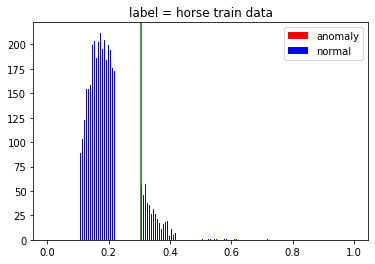

 train label = horse uncertain_img


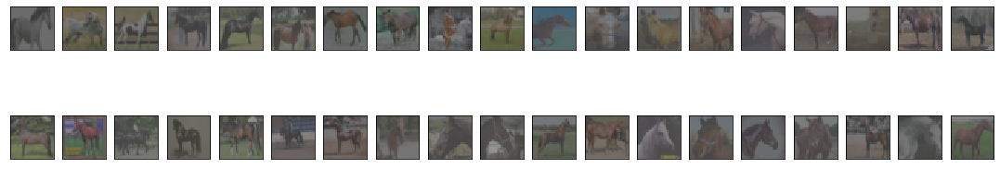

train label = 7 distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


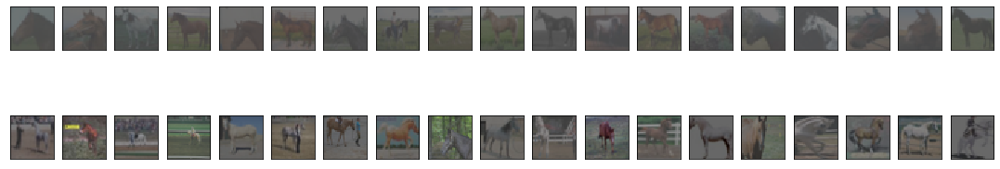

train label = horse false_img


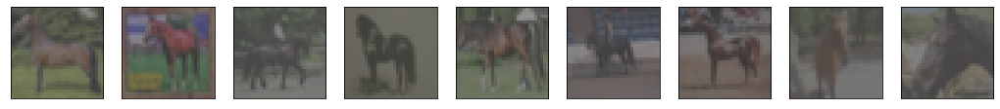

AUC: 0.5946403333333333
confusion_matrix:
[[2158 6842]
 [ 103  897]]


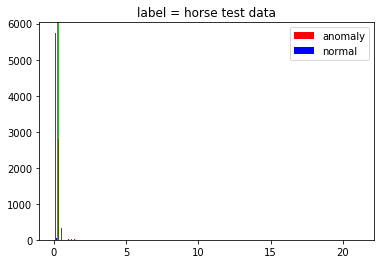

test label = horse uncertain_img


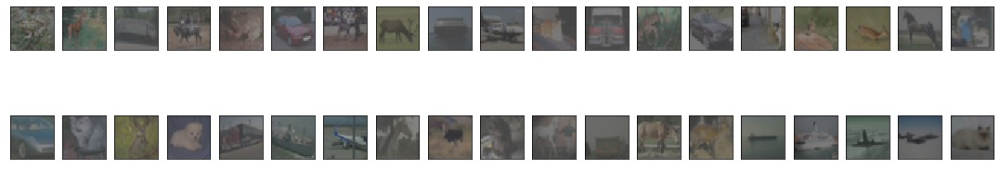

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = horse distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

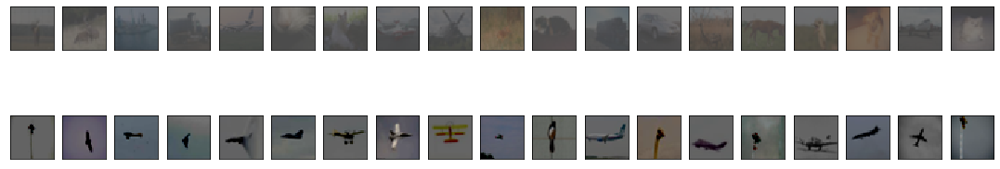

test label = horse false_img


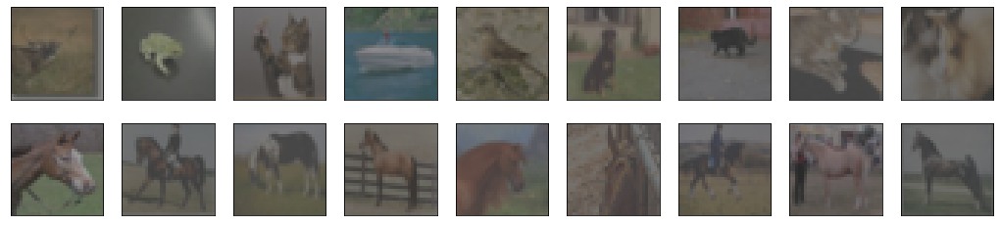

Loading  ship  data...


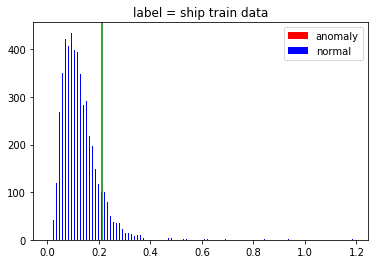

 train label = ship uncertain_img


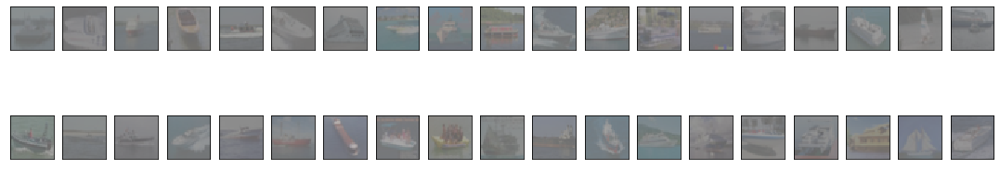

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 8 distance oder


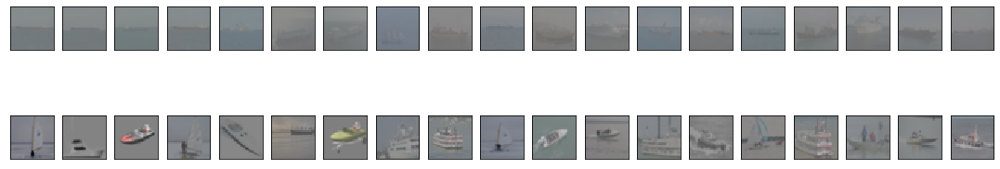

train label = ship false_img


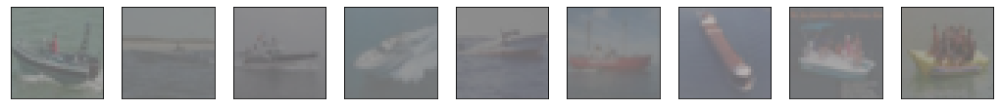

AUC: 0.7448016111111111
confusion_matrix:
[[3047 5953]
 [ 110  890]]


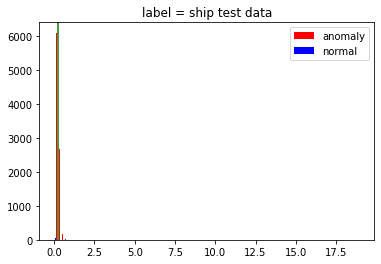

test label = ship uncertain_img


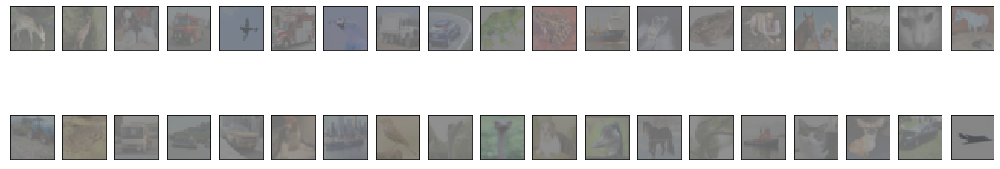

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


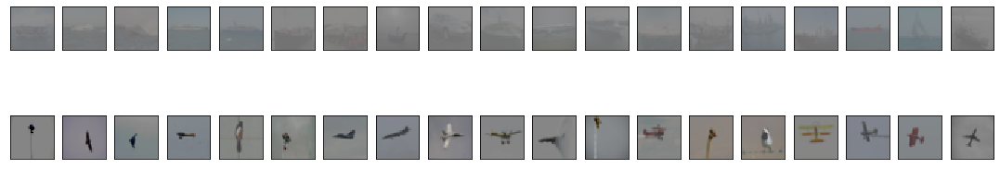

test label = ship false_img


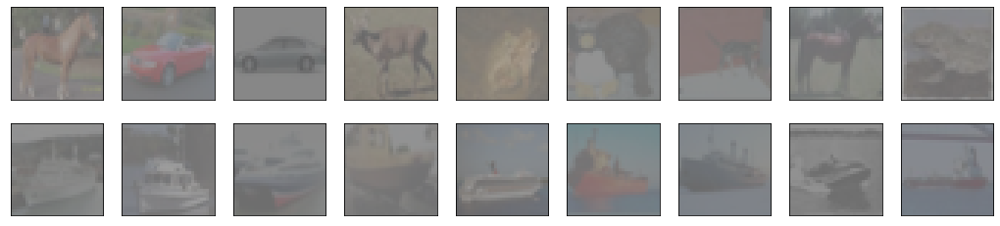

Loading  truck  data...


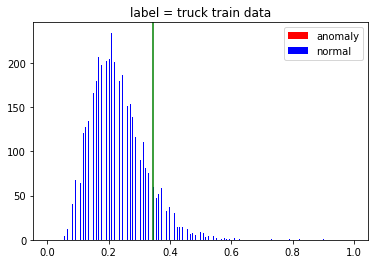

 train label = truck uncertain_img


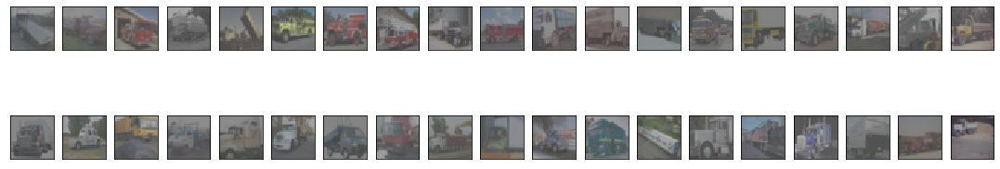

train label = 9 distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


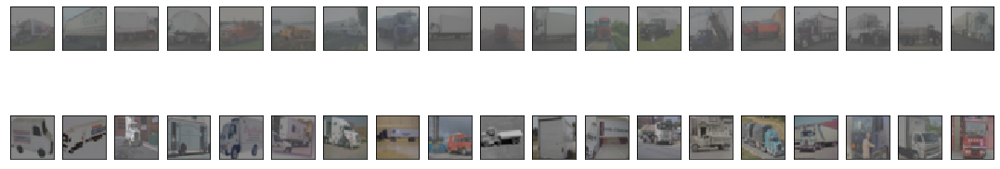

train label = truck false_img


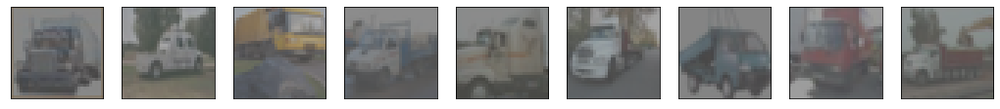

AUC: 0.6432714444444445
confusion_matrix:
[[2703 6297]
 [ 141  859]]


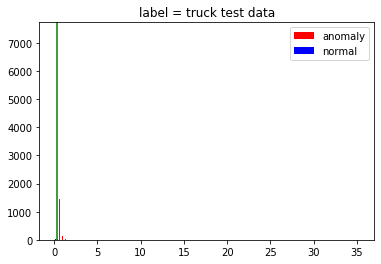

test label = truck uncertain_img


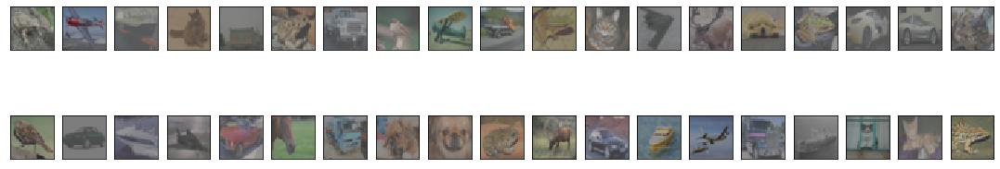

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

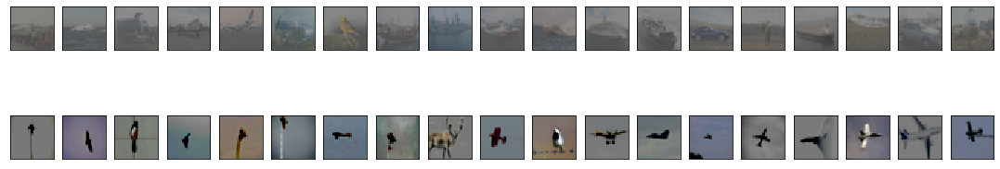

test label = truck false_img


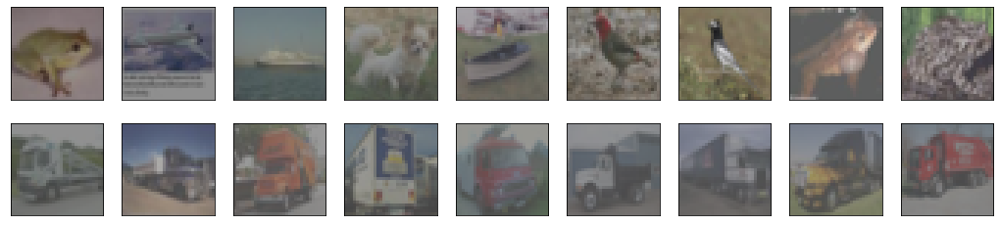

In [34]:
for label_num in np.arange(10):
    
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = True)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True, show_img = True)

## 有outlier

Loading  airplane  data...


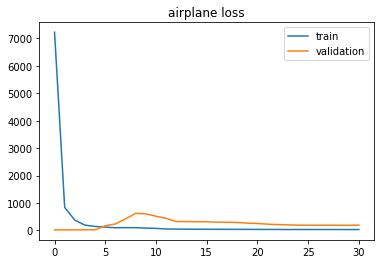

auc =  0.4996704444444445
[[ 471 8529]
 [  50  950]]
Loading  automobile  data...


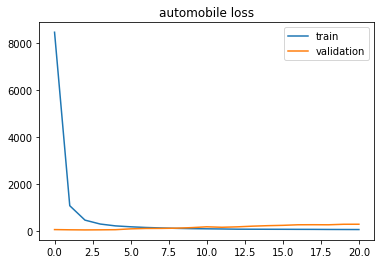

auc =  0.5225333333333334
[[ 630 8370]
 [  47  953]]
Loading  bird  data...


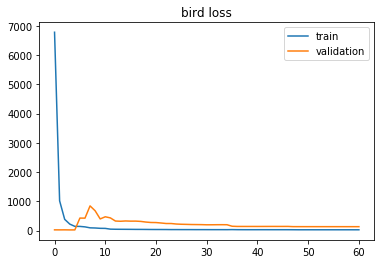

auc =  0.5201145555555555
[[ 435 8565]
 [  41  959]]
Loading  cat  data...


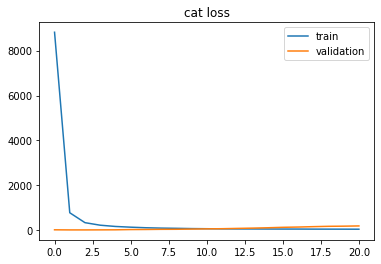

auc =  0.49881433333333336
[[ 521 8479]
 [  44  956]]
Loading  deer  data...


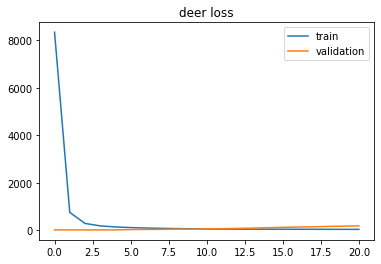

auc =  0.47490588888888885
[[ 350 8650]
 [  47  953]]
Loading  dog  data...


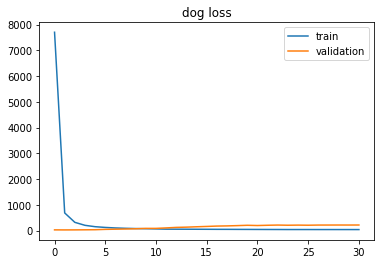

auc =  0.5013541666666667
[[ 544 8456]
 [  40  960]]
Loading  frog  data...


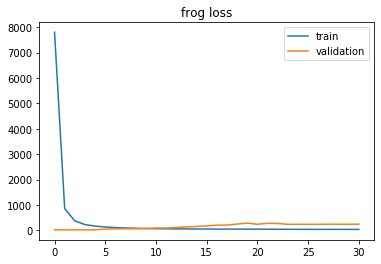

auc =  0.45418000000000003
[[ 317 8683]
 [  39  961]]
Loading  horse  data...


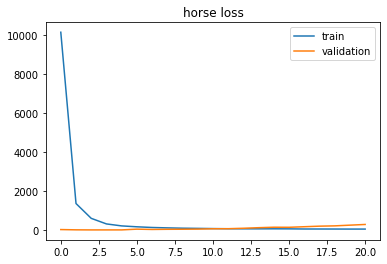

auc =  0.5003837222222222
[[ 197 8803]
 [  15  985]]
Loading  ship  data...


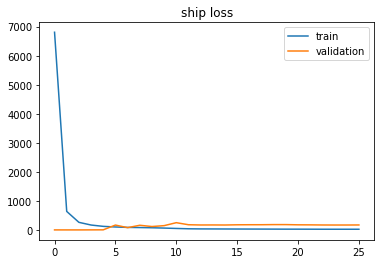

auc =  0.5631432222222222
[[ 433 8567]
 [  15  985]]
Loading  truck  data...


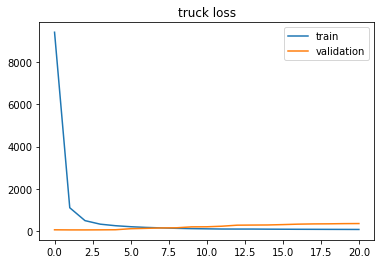

auc =  0.5177362222222222
[[ 394 8606]
 [  17  983]]


In [18]:
nu = 0.05
outlier_nu = 0.05
lr_change = 0.25
warm_up_n_epochs = 5
lr_milestone = 12
label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []
for label_num in np.arange(10):
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    ## 利用validation data 決定訓練epoch
    ae = Autoencoder(label_num)
    ae.train_ae(00, train_dataset)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    epoch_n= train_SVDD.validation_train( x_vali_tensor)
    ## 利用train data 訓練所有資料
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(train_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    train_SVDD.last_train(train_dataset, epoch_n)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = False)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True)
    print('auc = ', test_auc)
    print(confusionmatrix)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)


In [19]:
#outlier_nu = 0.3, nu = 0.5, smoothing = 4, warm_up_n_epochs = 30, lr_milestone = 10, lr_change = 0.5
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])
    print(confusionmatrix_list[i])

label =  airplane
auc =  0.4996704444444445
time =  15.828479528427124
[[ 471 8529]
 [  50  950]]
label =  automobile
auc =  0.5225333333333334
time =  11.294658184051514
[[ 630 8370]
 [  47  953]]
label =  bird
auc =  0.5201145555555555
time =  29.234074354171753
[[ 435 8565]
 [  41  959]]
label =  cat
auc =  0.49881433333333336
time =  9.995846271514893
[[ 521 8479]
 [  44  956]]
label =  deer
auc =  0.47490588888888885
time =  10.381419897079468
[[ 350 8650]
 [  47  953]]
label =  dog
auc =  0.5013541666666667
time =  14.334302186965942
[[ 544 8456]
 [  40  960]]
label =  frog
auc =  0.45418000000000003
time =  14.491393327713013
[[ 317 8683]
 [  39  961]]
label =  horse
auc =  0.5003837222222222
time =  10.229832649230957
[[ 197 8803]
 [  15  985]]
label =  ship
auc =  0.5631432222222222
time =  12.4974946975708
[[ 433 8567]
 [  15  985]]
label =  truck
auc =  0.5177362222222222
time =  10.155214786529541
[[ 394 8606]
 [  17  983]]


Loading  airplane  data...


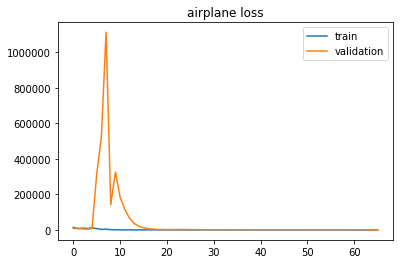

auc =  0.4996704444444445
[[1021 7979]
 [ 107  893]]
Loading  automobile  data...


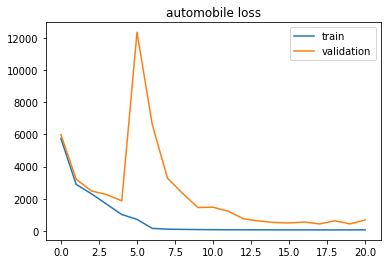

auc =  0.5225333333333334
[[1047 7953]
 [  89  911]]
Loading  bird  data...


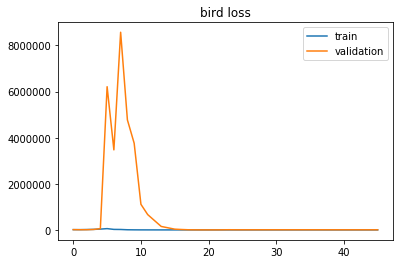

auc =  0.5201145555555555
[[ 947 8053]
 [ 100  900]]
Loading  cat  data...


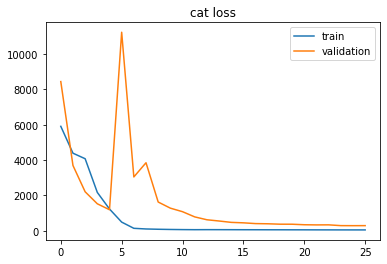

auc =  0.49881433333333336
[[ 966 8034]
 [  98  902]]
Loading  deer  data...


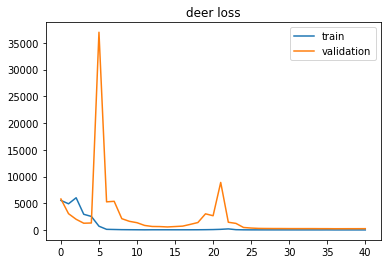

auc =  0.47490588888888885
[[ 607 8393]
 [  78  922]]
Loading  dog  data...


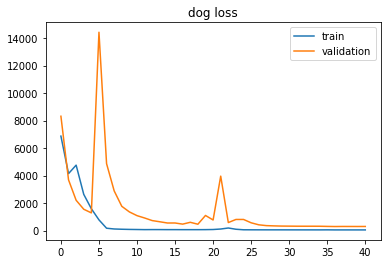

auc =  0.5013541666666667
[[1022 7978]
 [  85  915]]
Loading  frog  data...


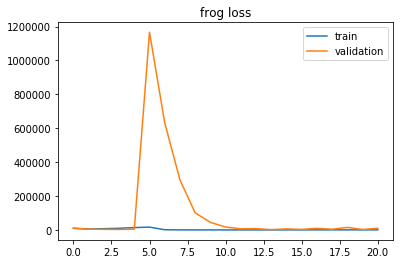

auc =  0.45418000000000003
[[ 682 8318]
 [  92  908]]
Loading  horse  data...


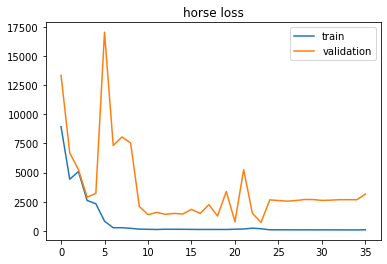

auc =  0.5003837222222222
[[ 361 8639]
 [  31  969]]
Loading  ship  data...


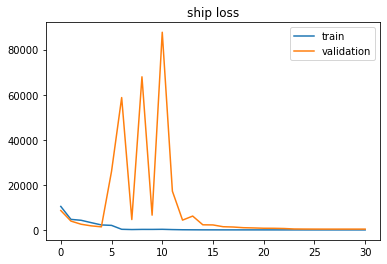

auc =  0.5631432222222222
[[ 907 8093]
 [  39  961]]
Loading  truck  data...


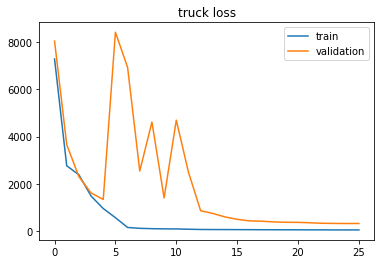

auc =  0.5177362222222222
[[ 649 8351]
 [  41  959]]


In [14]:
nu = 0.1
outlier_nu = 0.1
lr_change = 0.25
warm_up_n_epochs = 5
lr_milestone = 12
label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []
for label_num in np.arange(10):
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    ## 利用validation data 決定訓練epoch
    ae = Autoencoder(label_num)
    ae.train_ae(350, train_dataset)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    epoch_n= train_SVDD.validation_train( x_vali_tensor)
    ## 利用train data 訓練所有資料
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(train_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    train_SVDD.last_train(train_dataset, epoch_n)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = False)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True)
    print('auc = ', test_auc)
    print(confusionmatrix)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)


In [15]:
#outlier_nu = 0.3, nu = 0.5, smoothing = 4, warm_up_n_epochs = 30, lr_milestone = 10, lr_change = 0.5
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])
    print(confusionmatrix_list[i])

label =  airplane
auc =  0.4996704444444445
time =  28.854398012161255
[[1021 7979]
 [ 107  893]]
label =  automobile
auc =  0.5225333333333334
time =  10.614797115325928
[[1047 7953]
 [  89  911]]
label =  bird
auc =  0.5201145555555555
time =  20.862964630126953
[[ 947 8053]
 [ 100  900]]
label =  cat
auc =  0.49881433333333336
time =  12.64308762550354
[[ 966 8034]
 [  98  902]]
label =  deer
auc =  0.47490588888888885
time =  19.406720876693726
[[ 607 8393]
 [  78  922]]
label =  dog
auc =  0.5013541666666667
time =  18.691376209259033
[[1022 7978]
 [  85  915]]
label =  frog
auc =  0.45418000000000003
time =  10.19649624824524
[[ 682 8318]
 [  92  908]]
label =  horse
auc =  0.5003837222222222
time =  16.703194856643677
[[ 361 8639]
 [  31  969]]
label =  ship
auc =  0.5631432222222222
time =  14.622418403625488
[[ 907 8093]
 [  39  961]]
label =  truck
auc =  0.5177362222222222
time =  12.47005558013916
[[ 649 8351]
 [  41  959]]


Loading  airplane  data...


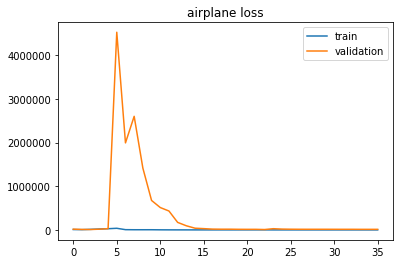

auc =  0.4996704444444445
[[2106 6894]
 [ 229  771]]
Loading  automobile  data...


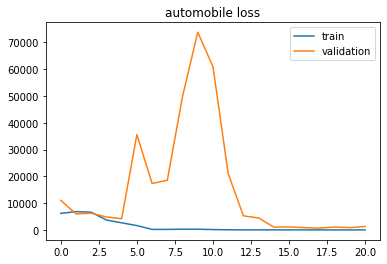

auc =  0.5225333333333334
[[1808 7192]
 [ 167  833]]
Loading  bird  data...


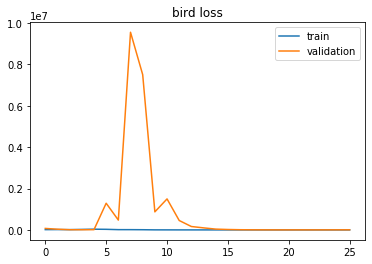

auc =  0.5201145555555555
[[2064 6936]
 [ 216  784]]
Loading  cat  data...


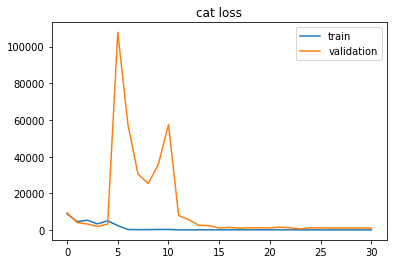

auc =  0.49881433333333336
[[1934 7066]
 [ 210  790]]
Loading  deer  data...


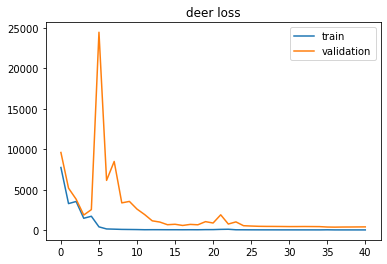

auc =  0.47490588888888885
[[1236 7764]
 [ 153  847]]
Loading  dog  data...


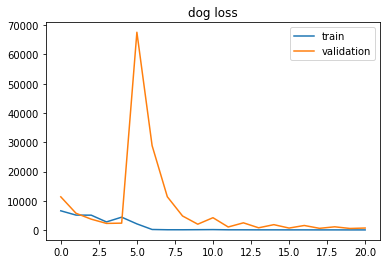

auc =  0.5013541666666667
[[1959 7041]
 [ 188  812]]
Loading  frog  data...


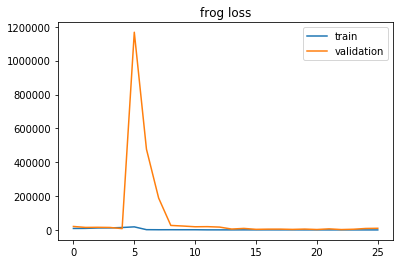

auc =  0.45418000000000003
[[1404 7596]
 [ 178  822]]
Loading  horse  data...


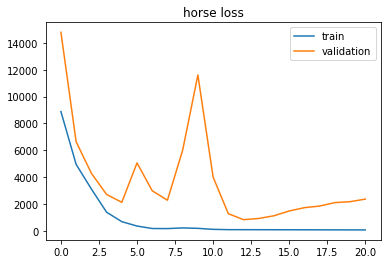

auc =  0.5003837222222222
[[ 693 8307]
 [  65  935]]
Loading  ship  data...


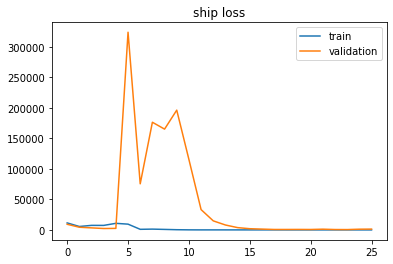

auc =  0.5631432222222222
[[1644 7356]
 [  93  907]]
Loading  truck  data...


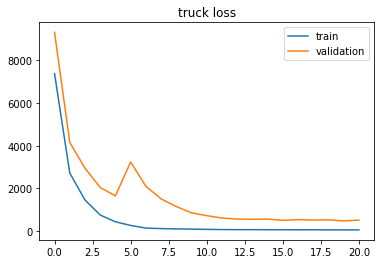

auc =  0.5177362222222222
[[1279 7721]
 [  90  910]]


In [16]:
nu = 0.2
outlier_nu = 0.2
lr_change = 0.25
warm_up_n_epochs = 5
lr_milestone = 12
label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []
for label_num in np.arange(10):
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    ## 利用validation data 決定訓練epoch
    ae = Autoencoder(label_num)
    ae.train_ae(350, train_dataset)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    epoch_n= train_SVDD.validation_train( x_vali_tensor)
    ## 利用train data 訓練所有資料
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(train_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    train_SVDD.last_train(train_dataset, epoch_n)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = False)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True)
    print('auc = ', test_auc)
    print(confusionmatrix)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)


In [17]:
#outlier_nu = 0.3, nu = 0.5, smoothing = 4, warm_up_n_epochs = 30, lr_milestone = 10, lr_change = 0.5
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])
    print(confusionmatrix_list[i])

label =  airplane
auc =  0.4996704444444445
time =  17.505739450454712
[[2106 6894]
 [ 229  771]]
label =  automobile
auc =  0.5225333333333334
time =  10.805443286895752
[[1808 7192]
 [ 167  833]]
label =  bird
auc =  0.5201145555555555
time =  12.717977285385132
[[2064 6936]
 [ 216  784]]
label =  cat
auc =  0.49881433333333336
time =  15.28380036354065
[[1934 7066]
 [ 210  790]]
label =  deer
auc =  0.47490588888888885
time =  19.553516626358032
[[1236 7764]
 [ 153  847]]
label =  dog
auc =  0.5013541666666667
time =  11.159015417098999
[[1959 7041]
 [ 188  812]]
label =  frog
auc =  0.45418000000000003
time =  13.455245018005371
[[1404 7596]
 [ 178  822]]
label =  horse
auc =  0.5003837222222222
time =  10.595038890838623
[[ 693 8307]
 [  65  935]]
label =  ship
auc =  0.5631432222222222
time =  12.79364824295044
[[1644 7356]
 [  93  907]]
label =  truck
auc =  0.5177362222222222
time =  10.62650465965271
[[1279 7721]
 [  90  910]]


Loading  airplane  data...


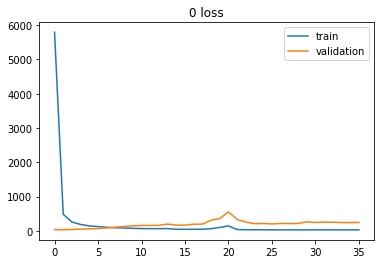

auc =  0.5559657222222222
[[1195 7805]
 [ 157  843]]
Loading  automobile  data...


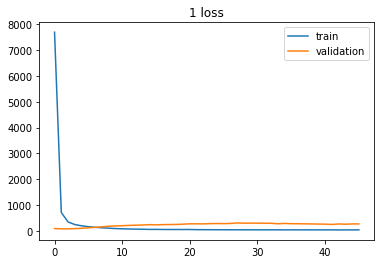

auc =  0.5364195555555555
[[4415 4585]
 [ 436  564]]
Loading  bird  data...


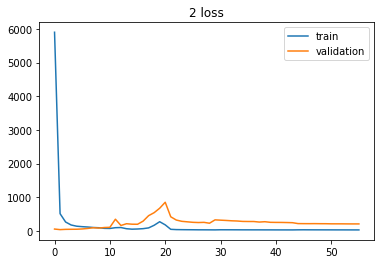

auc =  0.47766055555555553
[[ 651 8349]
 [  88  912]]
Loading  cat  data...


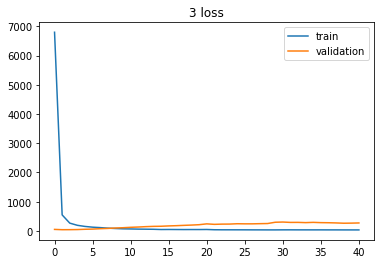

auc =  0.5934825
[[3689 5311]
 [ 286  714]]
Loading  deer  data...


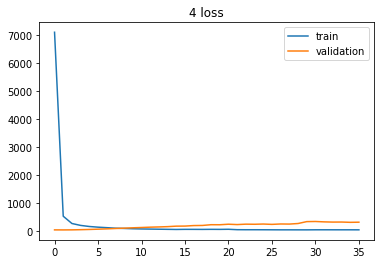

auc =  0.5280505
[[2697 6303]
 [ 272  728]]
Loading  dog  data...


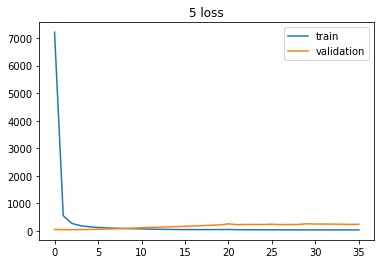

auc =  0.6560421666666666
[[4414 4586]
 [ 269  731]]
Loading  frog  data...


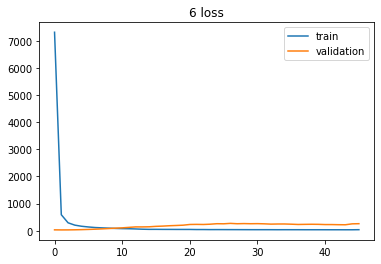

auc =  0.5437231111111112
[[3338 5662]
 [ 297  703]]
Loading  horse  data...


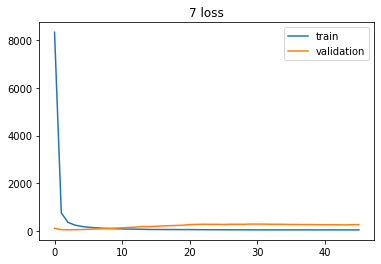

auc =  0.5554286111111111
[[3981 5019]
 [ 347  653]]
Loading  ship  data...


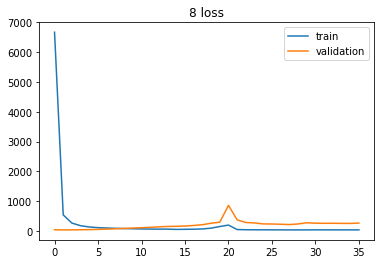

auc =  0.7133252777777779
[[3981 5019]
 [ 181  819]]
Loading  truck  data...


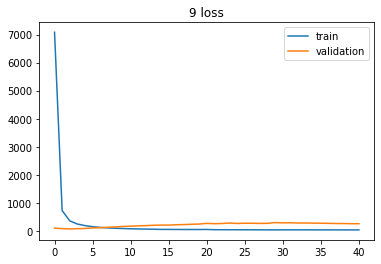

auc =  0.5957488888888889
[[4799 4201]
 [ 398  602]]


In [30]:
nu = 0.3
outlier_nu = 0.3

lr_change = 0.25
warm_up_n_epochs = 20
lr_milestone = 15

label_list = []
auc_list = []
time_list = []
confusionmatrix_list = []
for label_num in np.arange(10):
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    ## 利用validation data 決定訓練epoch
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    epoch_n= train_SVDD.validation_train( x_vali_tensor)
    ## 利用train data 訓練所有資料
    pre_time = time.time()
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(train_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    train_SVDD.last_train(train_dataset, epoch_n)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = False)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True)
    print('auc = ', test_auc)
    print(confusionmatrix)
    label_list.append(label_num)
    auc_list.append(test_auc)
    time_list.append(train_time)
    confusionmatrix_list.append(confusionmatrix)


In [31]:
#outlier_nu = 0.3, nu = 0.5, smoothing = 4, warm_up_n_epochs = 30, lr_milestone = 10, lr_change = 0.5
for i in range(len(names)):
    print('label = ', names[i])
    print('auc = ', auc_list[i])
    print('time = ', time_list[i])
    print(confusionmatrix_list[i])

label =  airplane
auc =  0.5559657222222222
time =  389.56128096580505
[[1195 7805]
 [ 157  843]]
label =  automobile
auc =  0.5364195555555555
time =  407.8896722793579
[[4415 4585]
 [ 436  564]]
label =  bird
auc =  0.47766055555555553
time =  409.96380829811096
[[ 651 8349]
 [  88  912]]
label =  cat
auc =  0.5934825
time =  393.61156463623047
[[3689 5311]
 [ 286  714]]
label =  deer
auc =  0.5280505
time =  388.0460889339447
[[2697 6303]
 [ 272  728]]
label =  dog
auc =  0.6560421666666666
time =  402.1251664161682
[[4414 4586]
 [ 269  731]]
label =  frog
auc =  0.5437231111111112
time =  400.31673526763916
[[3338 5662]
 [ 297  703]]
label =  horse
auc =  0.5554286111111111
time =  399.90456795692444
[[3981 5019]
 [ 347  653]]
label =  ship
auc =  0.7133252777777779
time =  394.14454197883606
[[3981 5019]
 [ 181  819]]
label =  truck
auc =  0.5957488888888889
time =  402.8473720550537
[[4799 4201]
 [ 398  602]]


Loading  airplane  data...


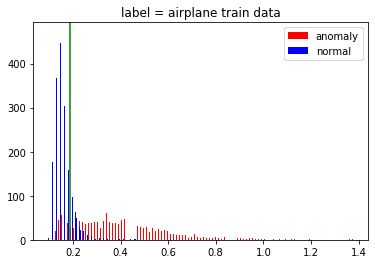

 train label = airplane uncertain_img


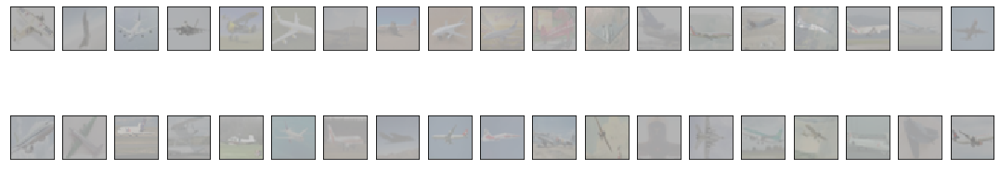

train label = 0 distance oder


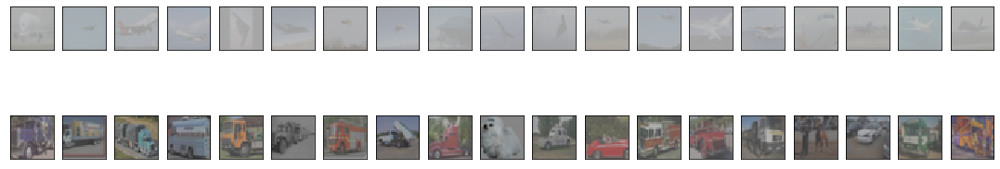

train label = airplane false_img


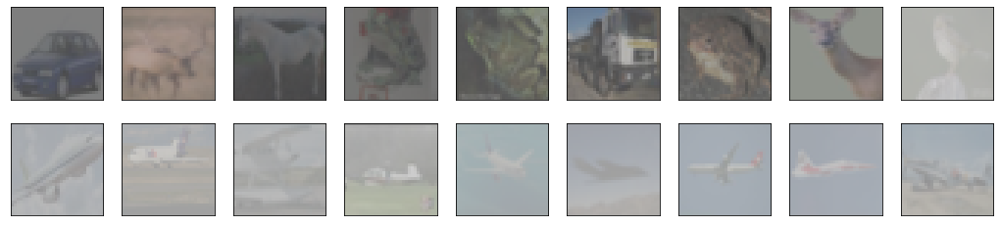

AUC: 0.5559657222222222
confusion_matrix:
[[1154 7846]
 [ 151  849]]


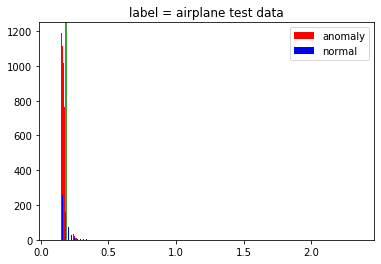

test label = airplane uncertain_img


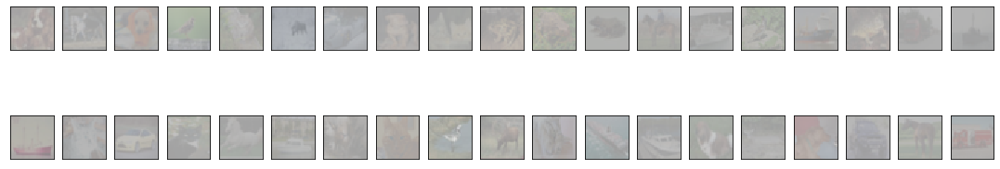

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = airplane distance oder


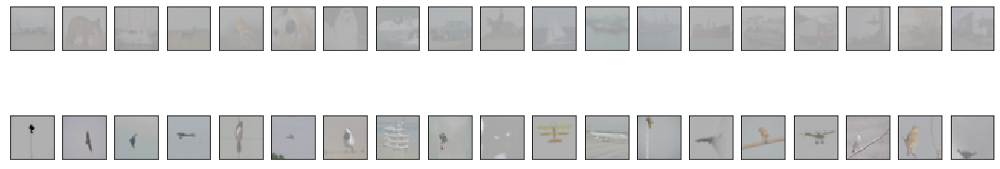

test label = airplane false_img


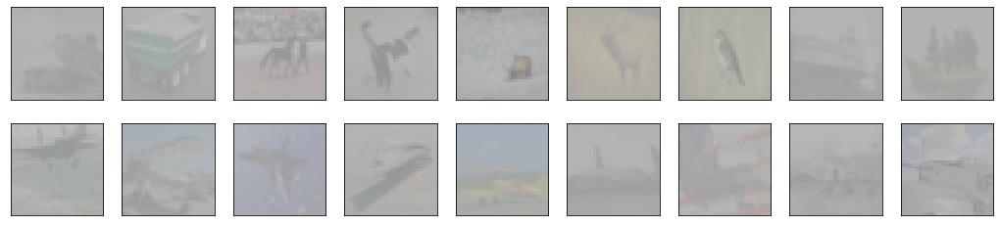

Loading  automobile  data...


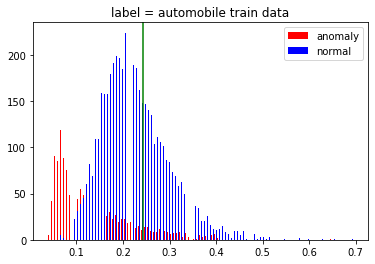

 train label = automobile uncertain_img


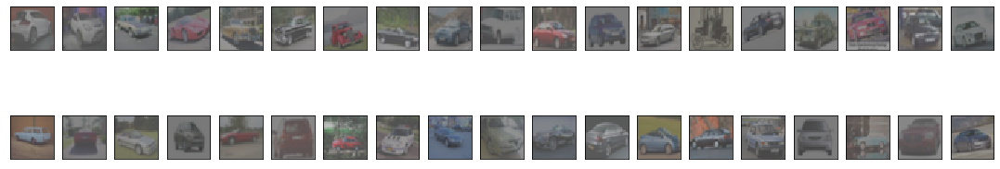

train label = 1 distance oder


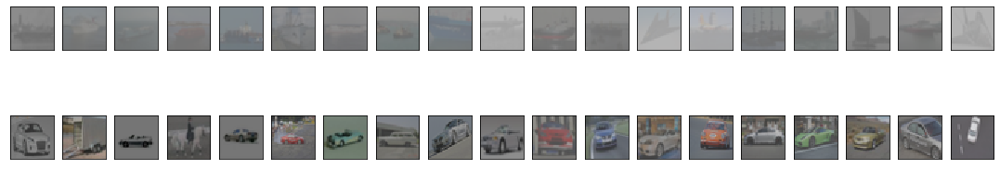

train label = automobile false_img


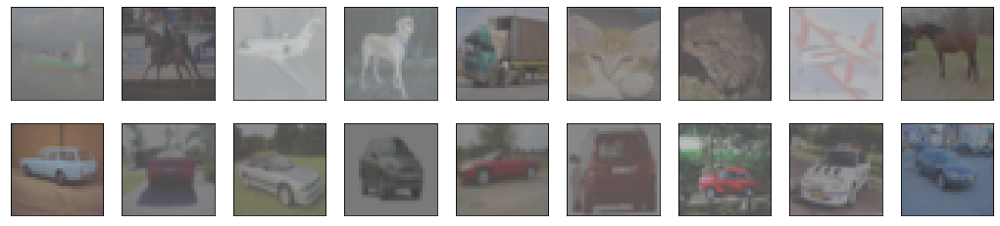

AUC: 0.5364195555555555
confusion_matrix:
[[4374 4626]
 [ 431  569]]


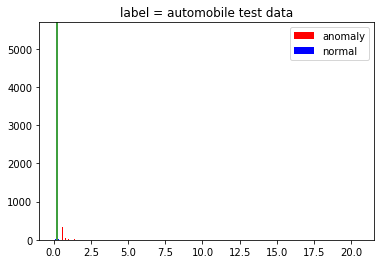

test label = automobile uncertain_img


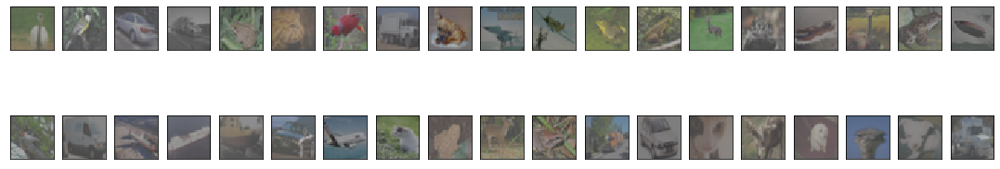

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = automobile distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

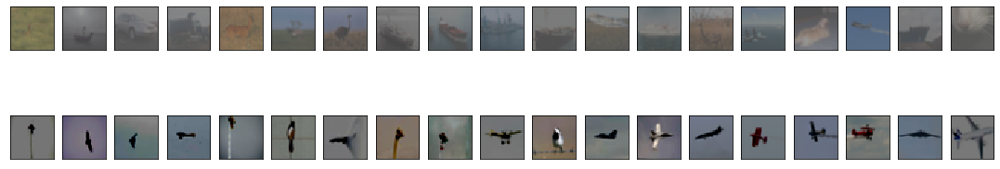

test label = automobile false_img


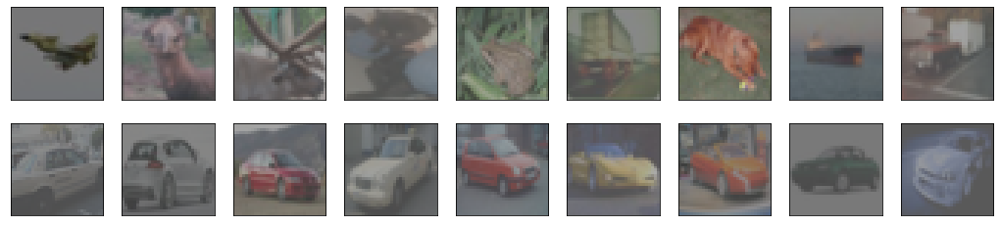

Loading  bird  data...


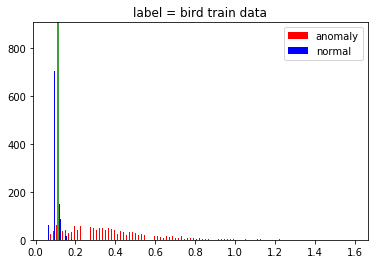

 train label = bird uncertain_img


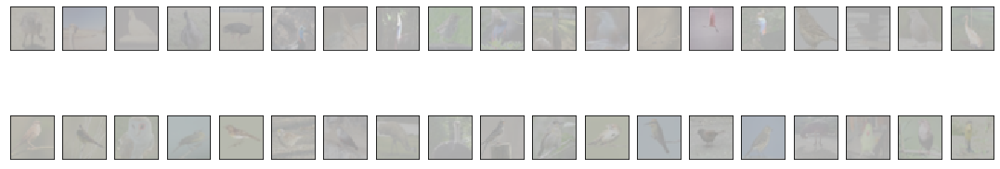

train label = 2 distance oder


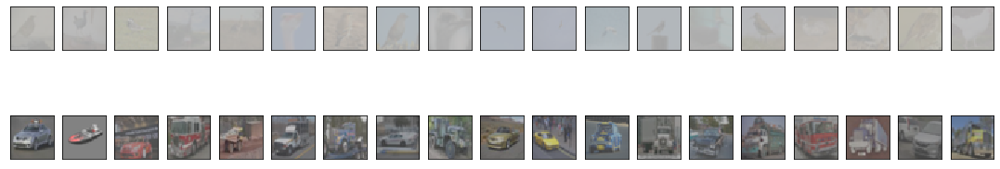

train label = bird false_img


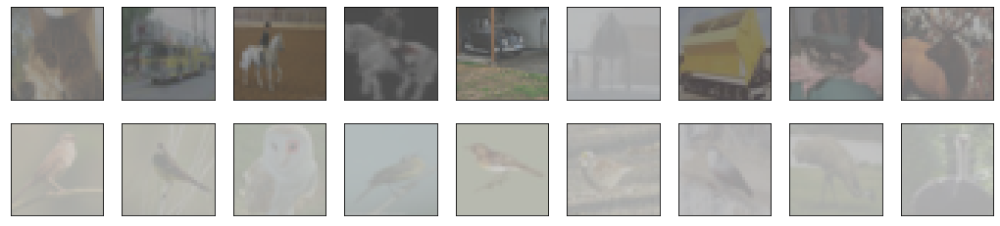

AUC: 0.47766055555555553
confusion_matrix:
[[ 679 8321]
 [  92  908]]


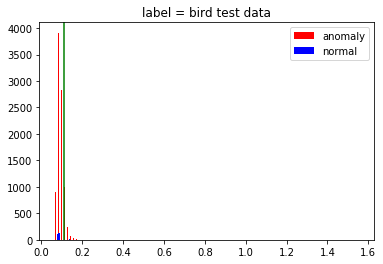

test label = bird uncertain_img


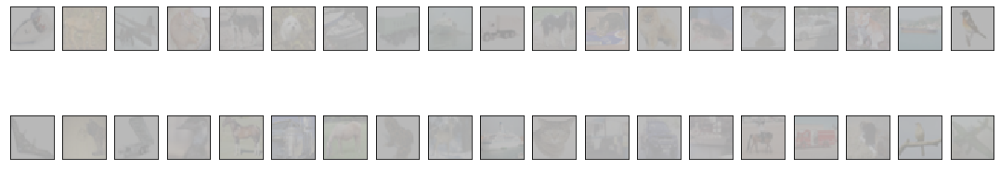

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = bird distance oder


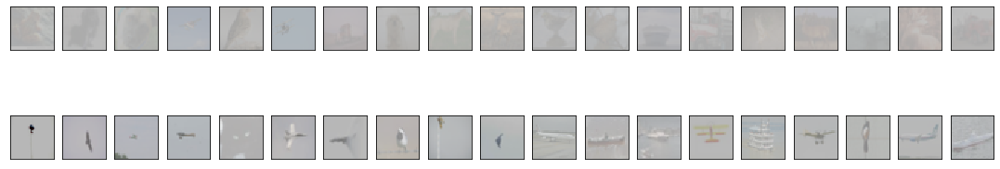

test label = bird false_img


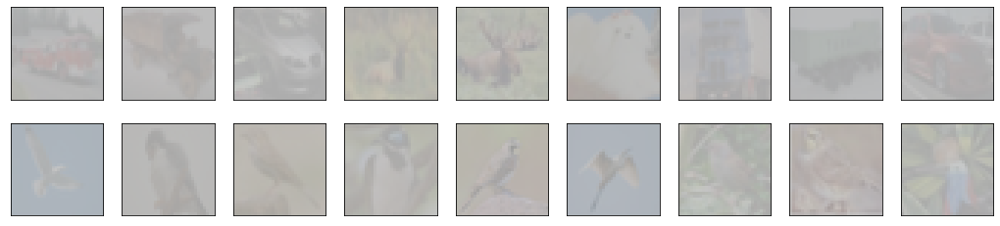

Loading  cat  data...


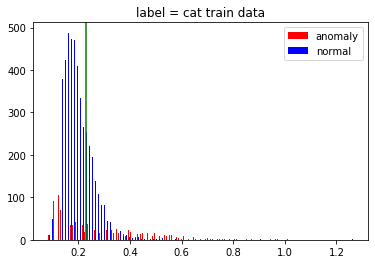

 train label = cat uncertain_img


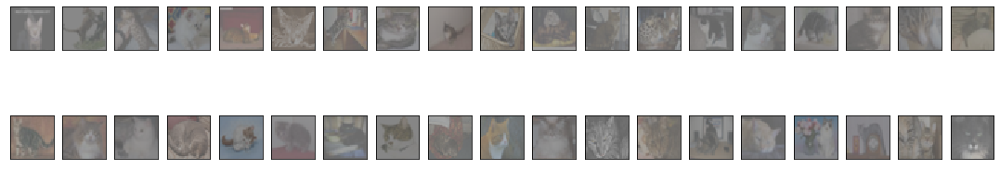

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 3 distance oder


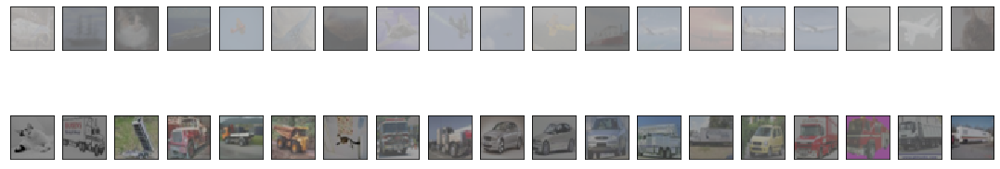

train label = cat false_img


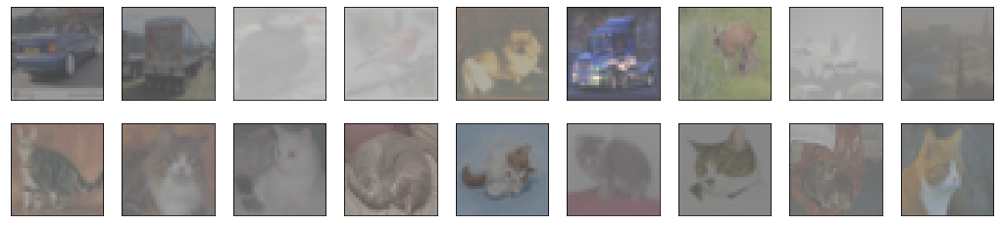

AUC: 0.5934825
confusion_matrix:
[[3720 5280]
 [ 289  711]]


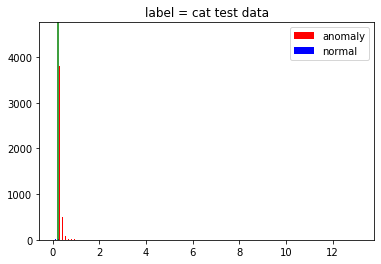

test label = cat uncertain_img


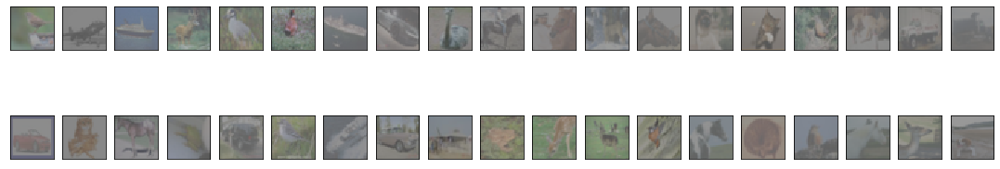

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = cat distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


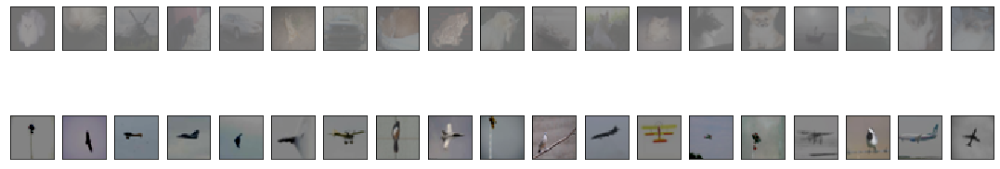

test label = cat false_img


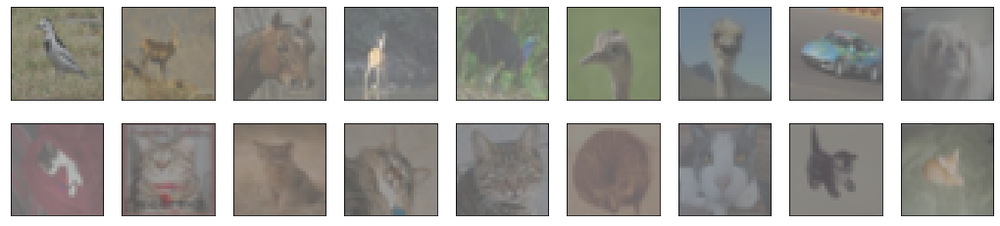

Loading  deer  data...


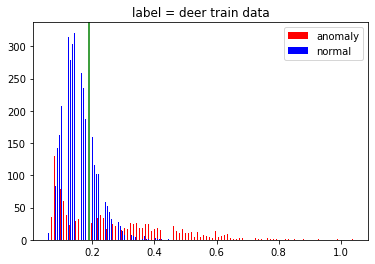

 train label = deer uncertain_img


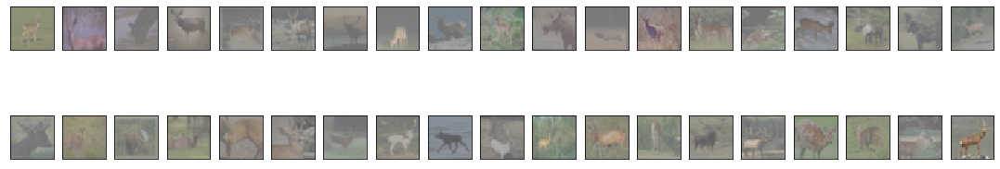

train label = 4 distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


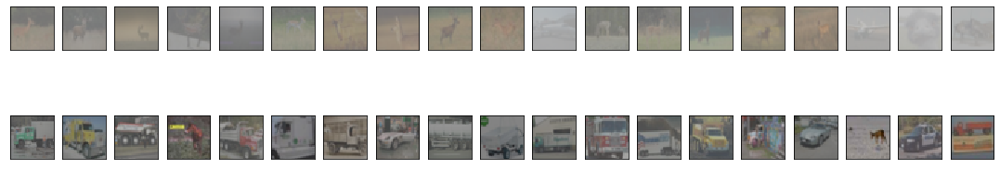

train label = deer false_img


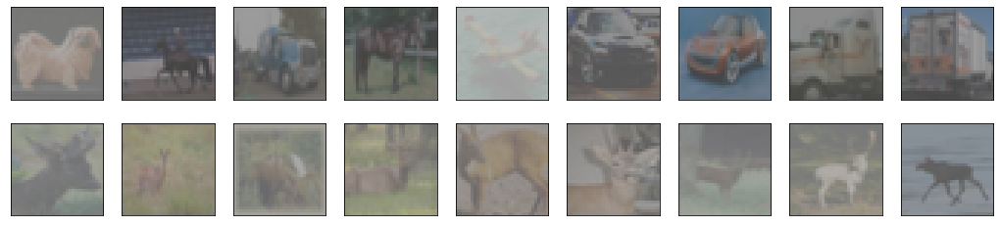

AUC: 0.5280505
confusion_matrix:
[[2708 6292]
 [ 272  728]]


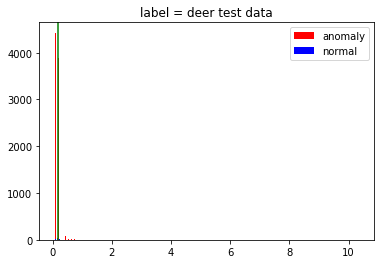

test label = deer uncertain_img


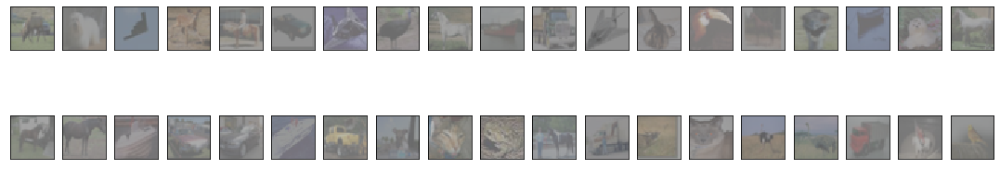

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = deer distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


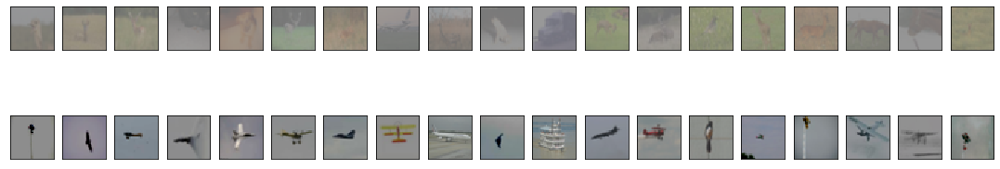

test label = deer false_img


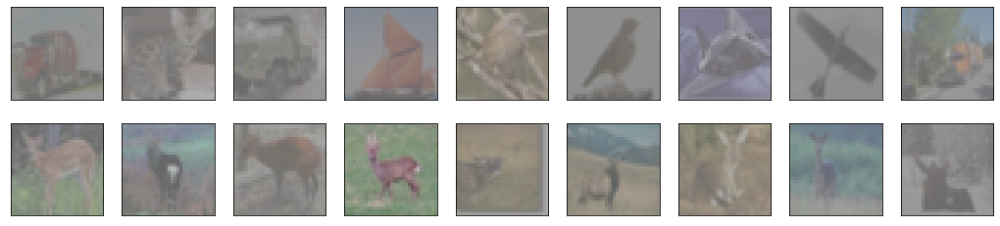

Loading  dog  data...


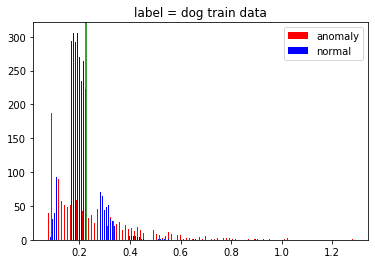

 train label = dog uncertain_img


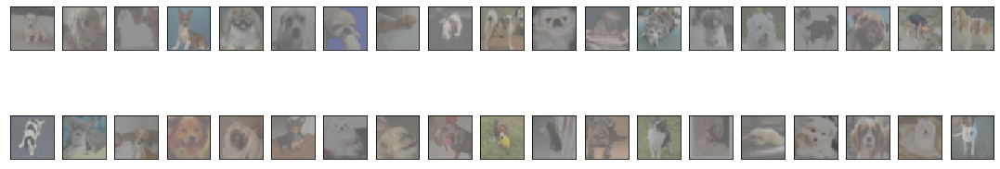

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 5 distance oder


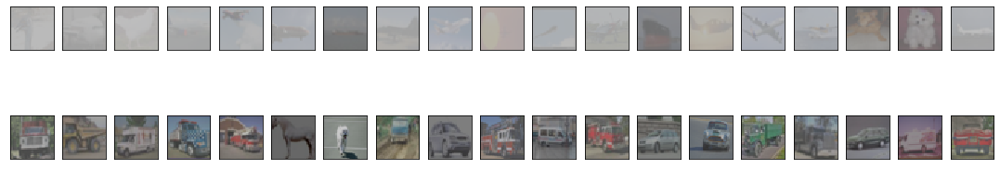

train label = dog false_img


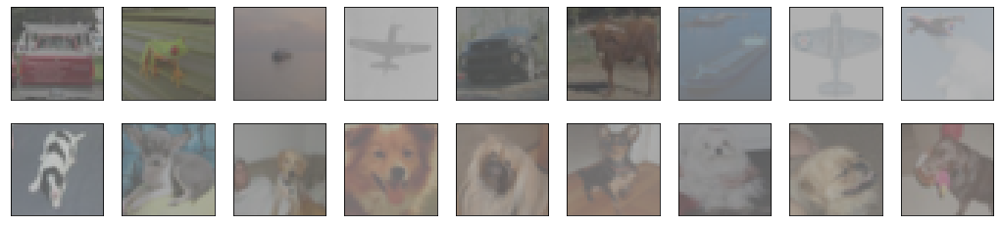

AUC: 0.6560421666666666
confusion_matrix:
[[4401 4599]
 [ 269  731]]


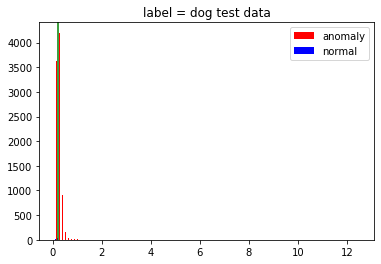

test label = dog uncertain_img


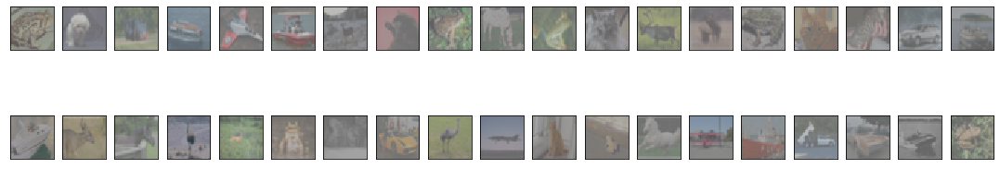

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = dog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


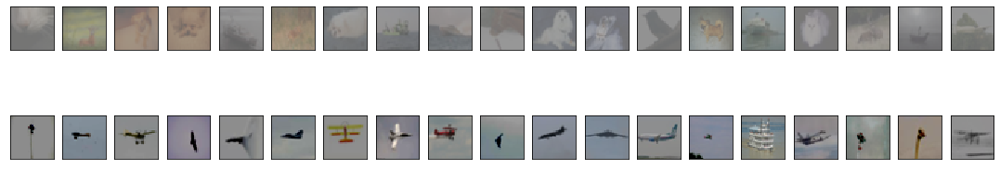

test label = dog false_img


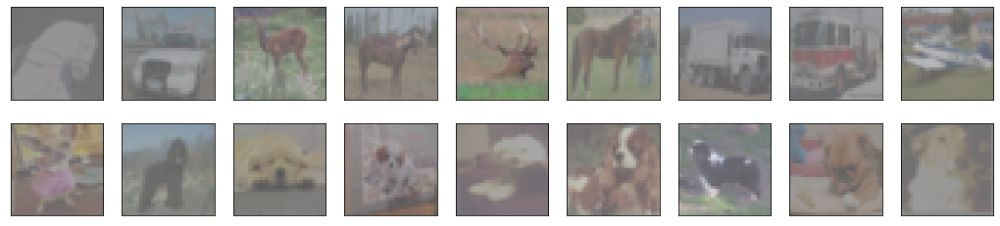

Loading  frog  data...


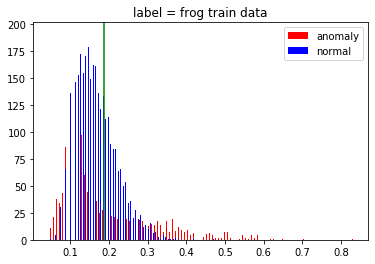

 train label = frog uncertain_img


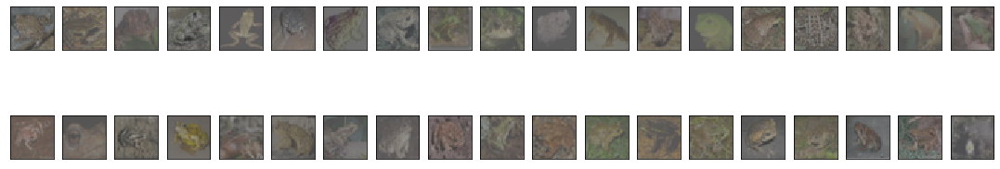

train label = 6 distance oder


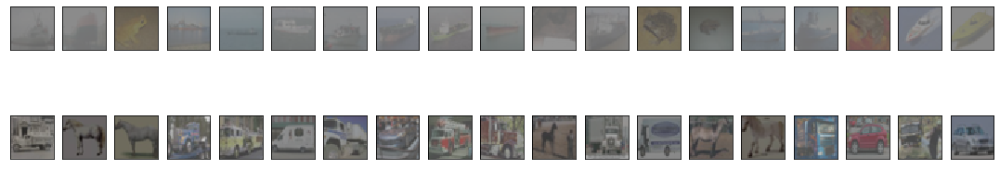

train label = frog false_img


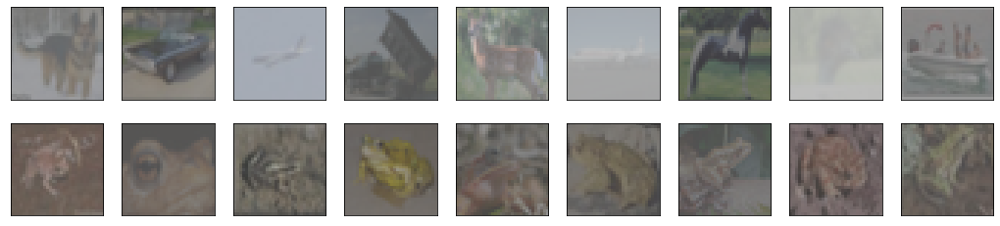

AUC: 0.5437231111111112
confusion_matrix:
[[3373 5627]
 [ 301  699]]


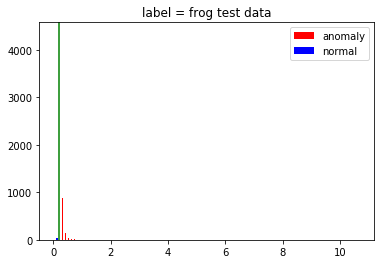

test label = frog uncertain_img


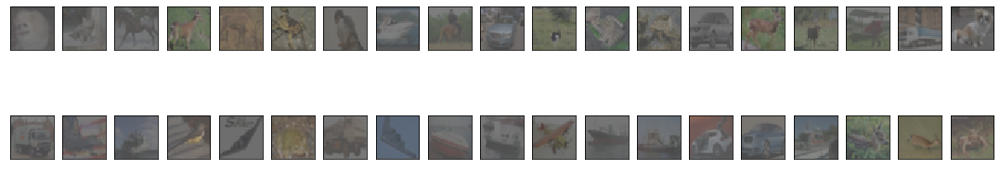

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = frog distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


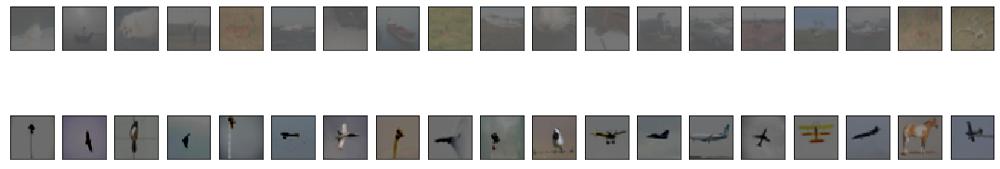

test label = frog false_img


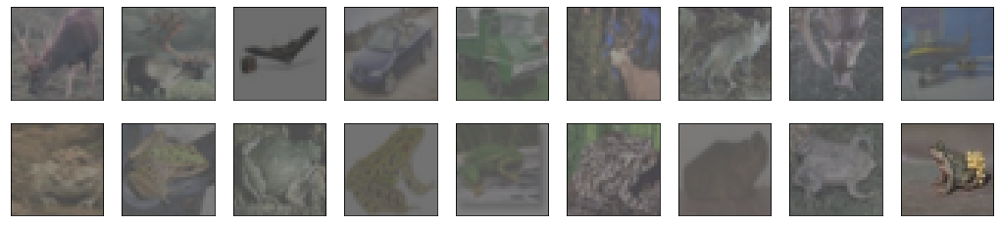

Loading  horse  data...


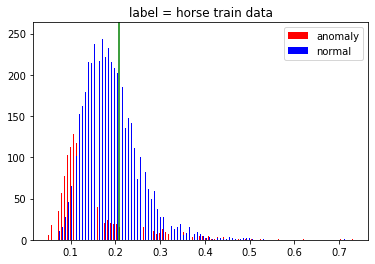

 train label = horse uncertain_img


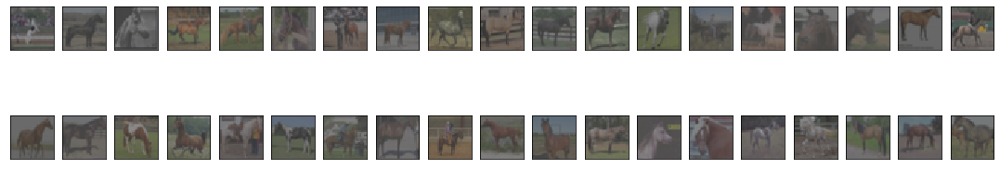

train label = 7 distance oder


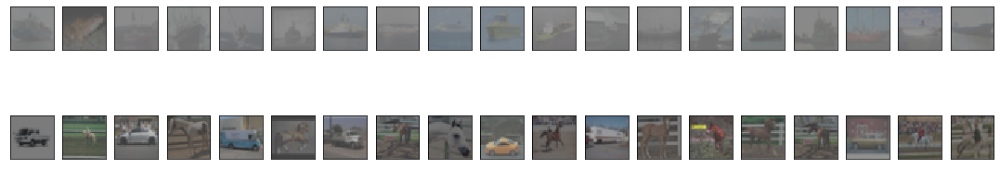

train label = horse false_img


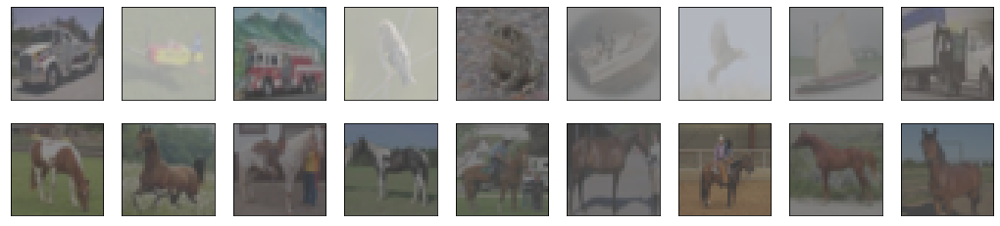

AUC: 0.5554286111111111
confusion_matrix:
[[3994 5006]
 [ 350  650]]


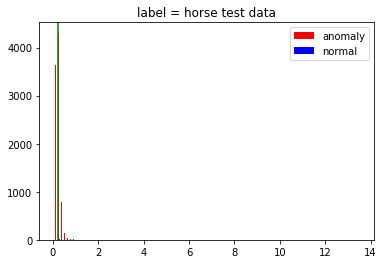

test label = horse uncertain_img


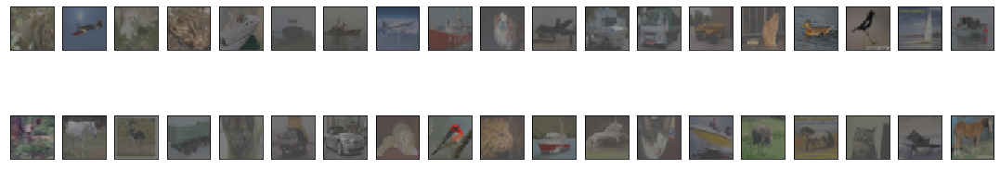

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = horse distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


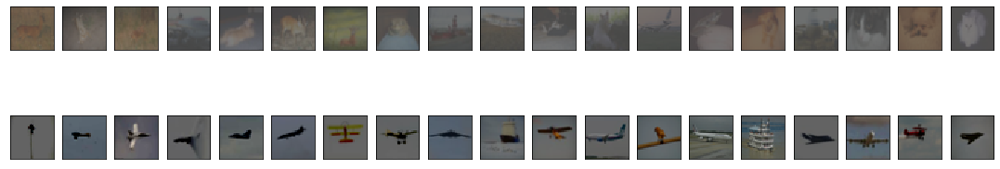

test label = horse false_img


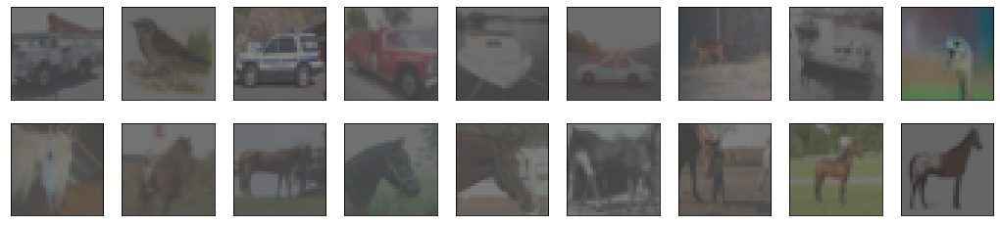

Loading  ship  data...


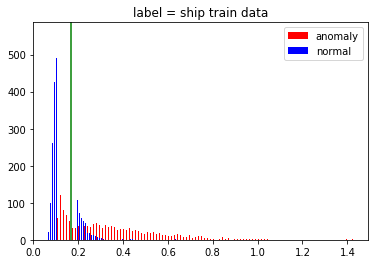

 train label = ship uncertain_img


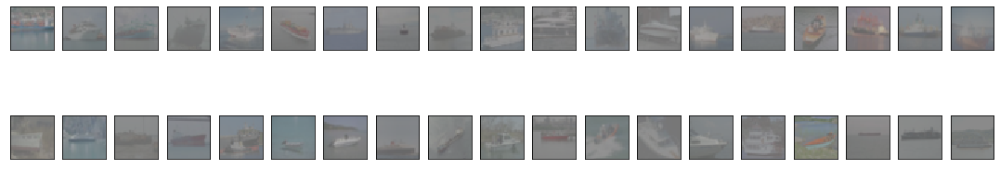

train label = 8 distance oder


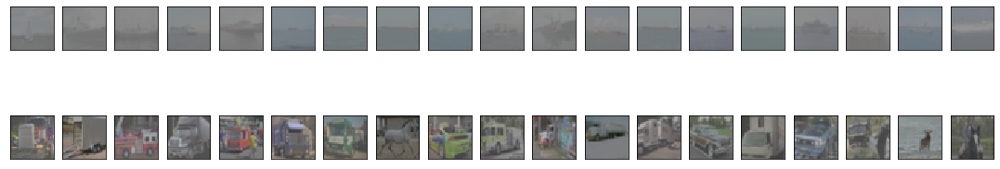

train label = ship false_img


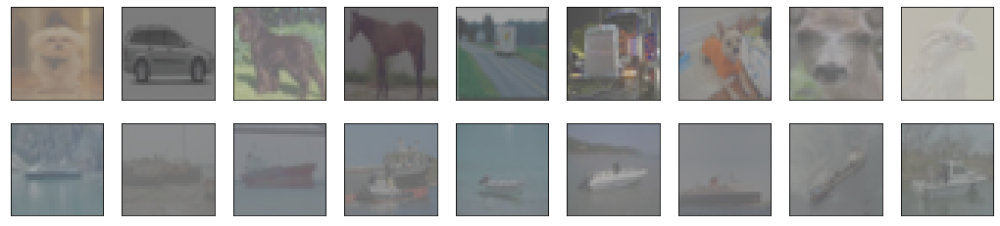

AUC: 0.7133252777777779
confusion_matrix:
[[3967 5033]
 [ 179  821]]


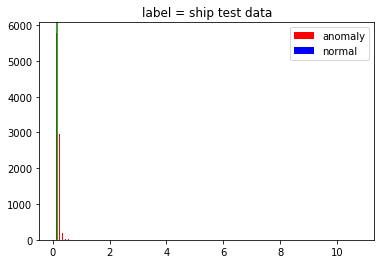

test label = ship uncertain_img


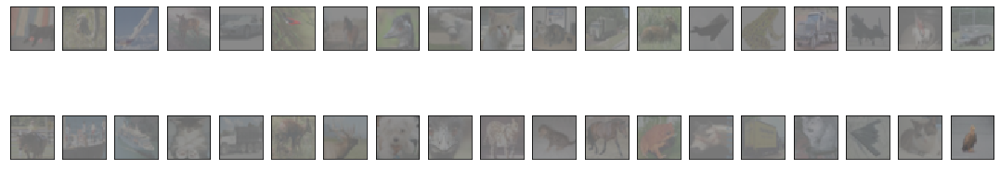

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = ship distance oder


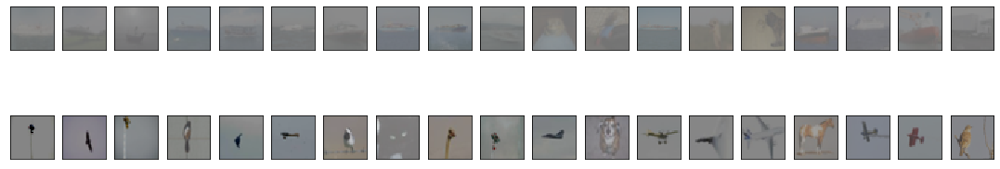

test label = ship false_img


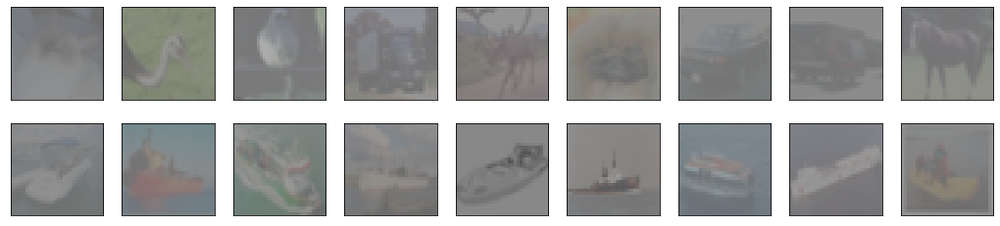

Loading  truck  data...


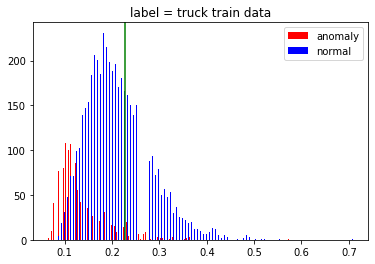

 train label = truck uncertain_img


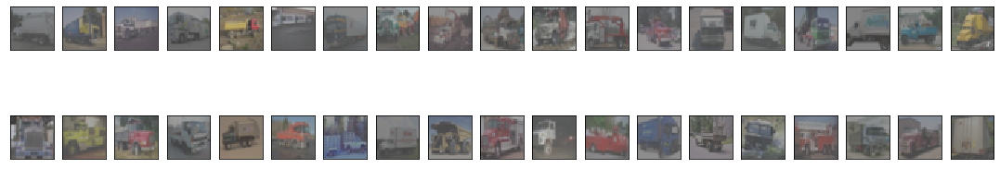

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


train label = 9 distance oder


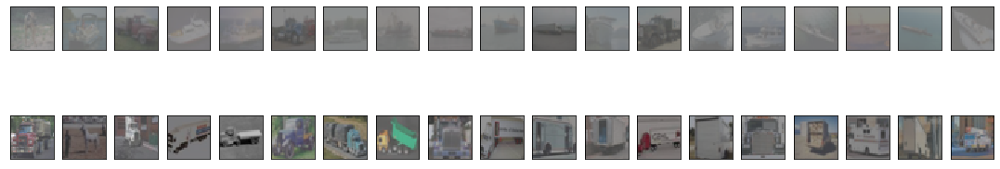

train label = truck false_img


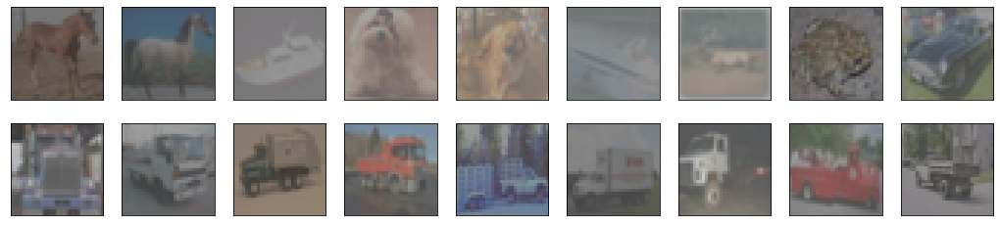

AUC: 0.5957488888888889
confusion_matrix:
[[4799 4201]
 [ 398  602]]


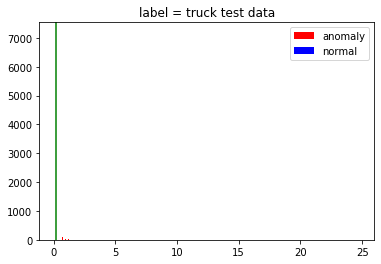

test label = truck uncertain_img


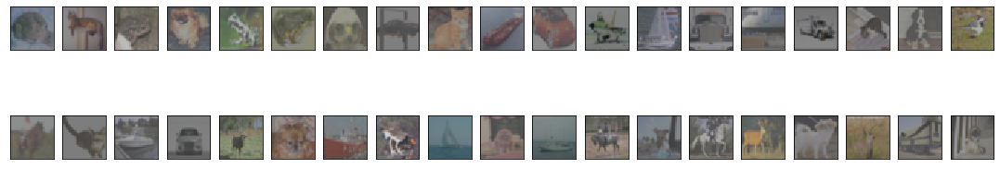

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


test label = truck distance oder


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

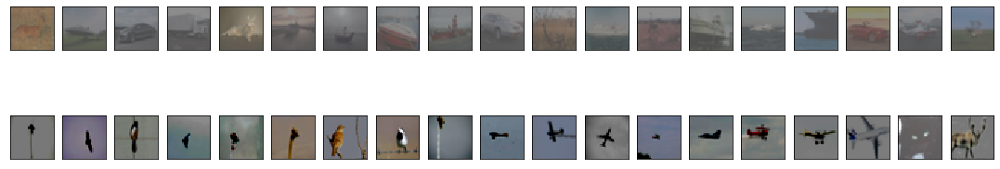

test label = truck false_img


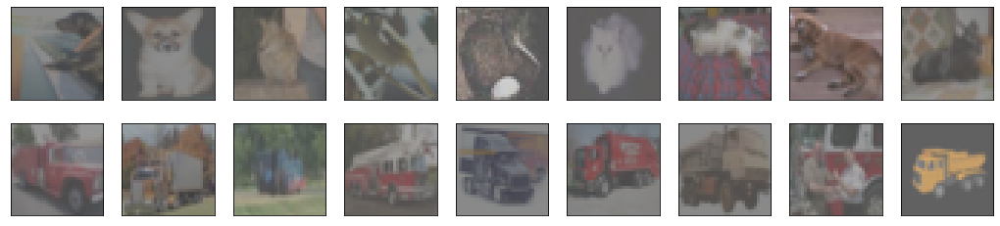

In [32]:
for label_num in np.arange(10):
    
    x_train, x_test, y_train, y_test = load_data(label_num = label_num, batch_size = 200, outlier_nu = outlier_nu)
    no_vali_dataset, train_dataset, x_vali_tensor, n_samples, validation_n = split_data(x_train)
    
    ae = Autoencoder(label_num)
    encoder = ae.encoder
    make_SVDD = make_SVDD_model(no_vali_dataset , encoder)
    SVDD_model = make_SVDD.make_model() 
    train_SVDD = Revisit_DeepSVDD_Trainer(label_num, nu, SVDD_model, lr_milestone, train_dataset, warm_up_n_epochs, lr_change)
    ## 訓練結果
    train_time = time.time() - pre_time
    train_SVDD.train_result(x_train, y_train, load_model = True, show_img = True)
    test_auc, confusionmatrix = train_SVDD.test_result(x_test, y_test, load_model = True, show_img = True)